<a href="https://colab.research.google.com/github/bassemr/one-short-learning/blob/main/notebooks/One_shot_learning_with_Cifar100_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# One shot learning with Cifar100 dataset

## 0. Computer vision libraries in PyTorch

* [`torchvision`] - base domain library for PyTorch computer vision
* `torchvision.dataset` - get dataset and data loading functions for computer vision
* `torchvision.models` - get pretrained computer vision models that can leverage for your own problems
* `torchvision.transforms` - function for manipulating your vision data (images) to be suitable for use with an ML model
* `torch.utils.data.Dataset` - Base dataset class for PyTorch.
* `torch.utils.data.DataLoader` - Create a Python iterable over a dataset


In [ ]:
# Import PyTorch
import torch
from torch import nn
# Setup training data
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision import transforms

# Import torchvision
import torchvision
from torchvision import datasets
from torchvision.transforms import ToTensor

# Import matplotlib for visualization
import matplotlib.pyplot as plt
# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Check versions
# Note: your PyTorch version shouldn't be lower than 1.10.0 and torchvision version shouldn't be lower than 0.11
print(f"PyTorch version: {torch.__version__}\ntorchvision version: {torchvision.__version__}")

[INFO] Couldn't find torchinfo... installing it.
PyTorch version: 2.8.0+cu126
torchvision version: 0.23.0+cu126


## 1. Getting a dataset

The dataset we'll be using is FashionMNIST from torchvision.datasets - https://pytorch.org/vision/stable/generated/torchvision.datasets.CIFAR100.html

In [ ]:
# Setup training data
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision import transforms

train_data = datasets.CIFAR100(
    root='data', # where to download data to?
    train=True, # do we want the training dataset?
    download=True, # do we want to download yes/no
    transform=ToTensor(), # how do we want to transform the data?
    target_transform=None # how do we want to transforms the labels/targets?
)

test_data = datasets.CIFAR100(
    root="data",
    train=False,
    download=True,
    transform=ToTensor(),
    target_transform=None
)

100%|██████████| 169M/169M [00:03<00:00, 43.4MB/s]


In [ ]:
# See first training sample
image, label = train_data[0]
image, label

(tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.7647, 0.8314, 0.7137],
          [1.0000, 0.9961, 0.9961,  ..., 0.6667, 0.6314, 0.5725],
          [1.0000, 0.9961, 1.0000,  ..., 0.7412, 0.6510, 0.4745],
          ...,
          [0.5804, 0.5569, 0.5490,  ..., 0.1176, 0.2549, 0.2980],
          [0.4784, 0.4706, 0.4941,  ..., 0.0863, 0.3804, 0.5529],
          [0.3412, 0.3451, 0.3961,  ..., 0.1333, 0.4118, 0.5412]],
 
         [[1.0000, 1.0000, 1.0000,  ..., 0.8039, 0.8784, 0.7608],
          [1.0000, 0.9961, 0.9961,  ..., 0.6902, 0.6588, 0.6039],
          [1.0000, 0.9961, 1.0000,  ..., 0.7804, 0.6980, 0.5216],
          ...,
          [0.7255, 0.7137, 0.7020,  ..., 0.0667, 0.2431, 0.3020],
          [0.6157, 0.6078, 0.6275,  ..., 0.0627, 0.4392, 0.6314],
          [0.4784, 0.4784, 0.5255,  ..., 0.1412, 0.5216, 0.6784]],
 
         [[1.0000, 1.0000, 1.0000,  ..., 0.7569, 0.8000, 0.6549],
          [1.0000, 0.9961, 0.9961,  ..., 0.5882, 0.5098, 0.4431],
          [1.0000, 0.9961, 1.0000,  ...,

### 1.1 Input and output shapes of a computer vision model
We've got a big tensor of values (the image) leading to a single value for the target (the label).

Let's see the image shape.

In [ ]:
# What's the shape of the image?
image.shape # [color_channels=3, height=32, width=32]

torch.Size([3, 32, 32])

* Let's check out more shapes of our data.

In [ ]:
# How many samples are there?
print(f"train data: {len(train_data.data)}, train target: {len(train_data.targets)}")
print(f"test data: {len(test_data.data)} , test target: {len(test_data.targets)}") #50,000 training samples and 10,000 testing samples.

train data: 50000, train target: 50000
test data: 10000 , test target: 10000


What classes are there?

We can find these via the `.classes` attribute.

In [ ]:
# See classes
class_names = train_data.classes
class_names, len(class_names)

(['apple',
  'aquarium_fish',
  'baby',
  'bear',
  'beaver',
  'bed',
  'bee',
  'beetle',
  'bicycle',
  'bottle',
  'bowl',
  'boy',
  'bridge',
  'bus',
  'butterfly',
  'camel',
  'can',
  'castle',
  'caterpillar',
  'cattle',
  'chair',
  'chimpanzee',
  'clock',
  'cloud',
  'cockroach',
  'couch',
  'crab',
  'crocodile',
  'cup',
  'dinosaur',
  'dolphin',
  'elephant',
  'flatfish',
  'forest',
  'fox',
  'girl',
  'hamster',
  'house',
  'kangaroo',
  'keyboard',
  'lamp',
  'lawn_mower',
  'leopard',
  'lion',
  'lizard',
  'lobster',
  'man',
  'maple_tree',
  'motorcycle',
  'mountain',
  'mouse',
  'mushroom',
  'oak_tree',
  'orange',
  'orchid',
  'otter',
  'palm_tree',
  'pear',
  'pickup_truck',
  'pine_tree',
  'plain',
  'plate',
  'poppy',
  'porcupine',
  'possum',
  'rabbit',
  'raccoon',
  'ray',
  'road',
  'rocket',
  'rose',
  'sea',
  'seal',
  'shark',
  'shrew',
  'skunk',
  'skyscraper',
  'snail',
  'snake',
  'spider',
  'squirrel',
  'streetcar',
  

### 1.2 Visualizing our data


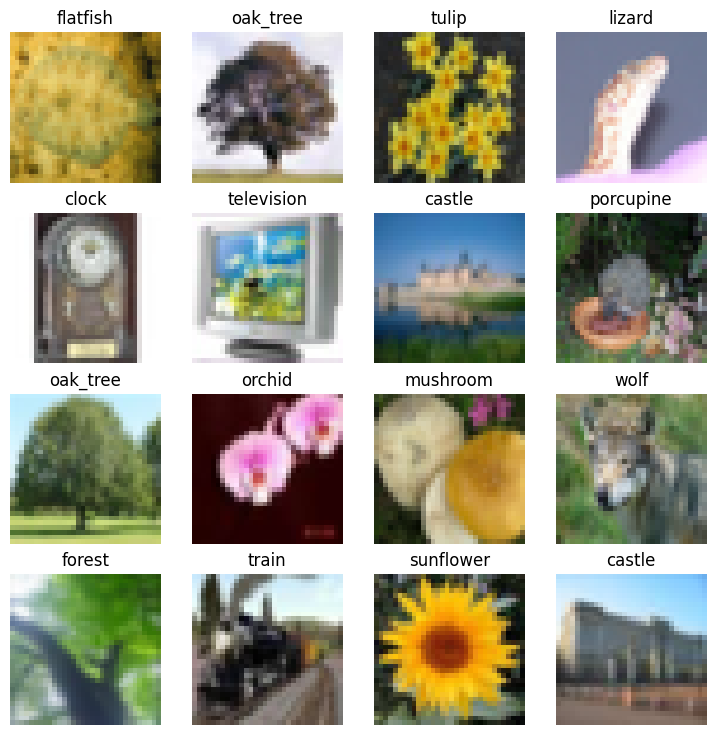

In [ ]:
# Plot more images
torch.manual_seed(42)
fig = plt.figure(figsize=(9, 9))
rows, cols = 4, 4
for i in range(1, rows * cols + 1):
    random_idx = torch.randint(0, len(train_data), size=[1]).item()

    img, label = train_data[random_idx]
    fig.add_subplot(rows, cols, i)
    plt.imshow(img.permute(1, 2, 0))  # from (C,H,W) -> (H,W,C)
    plt.axis("off")
    plt.title(class_names[label])

## 2. Preparing our data


### 2.1 get a clone of the project from github




The project link - https://github.com/bassemr/one-short-learning.git

In [ ]:
!pwd

/content


In [ ]:
# download the project from github
def git_project():
  !git clone https://github.com/bassemr/one-short-learning.git
  %cd /content/one-short-learning

# Update changes
def update_git():
  %cd /content/one-short-learning
  !git fetch origin
  !git merge origin/main

In [ ]:
# create a copy of the project in google colab
git_project()

Cloning into 'one-short-learning'...
remote: Enumerating objects: 274, done.
remote: Counting objects: 100% (125/125), done.
remote: Compressing objects: 100% (106/106), done.
remote: Total 274 (delta 45), reused 83 (delta 17), pack-reused 149 (from 1)
Receiving objects: 100% (274/274), 61.31 MiB | 22.66 MiB/s, done.
Resolving deltas: 100% (120/120), done.
/content/one-short-learning


In [ ]:
#import importlib
#import data_utils as du
#importlib.reload(du)

In [ ]:
# Python's Files
!pwd
!ls /content/one-short-learning/siamese/

/content/one-short-learning
data_utils.py  evaluate.py  helper_functions.py  models.py  train.py


### 2.2 get the train/valid/test data from `data_utils.py`

In [ ]:
# import data.utils.py
import sys
sys.path.append("/content/one-short-learning/siamese") # my python's files are inside siamese folder
from data_utils import prepare_data
from train import train, create_writer, save_model
from evaluate import evaluate_fewshot_distance, evaluate_fewshot_cosine
# Import the model from models
from models import SiameseResNet, SiameseCNN
from helper_functions import plot_history, plot_history_best_model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

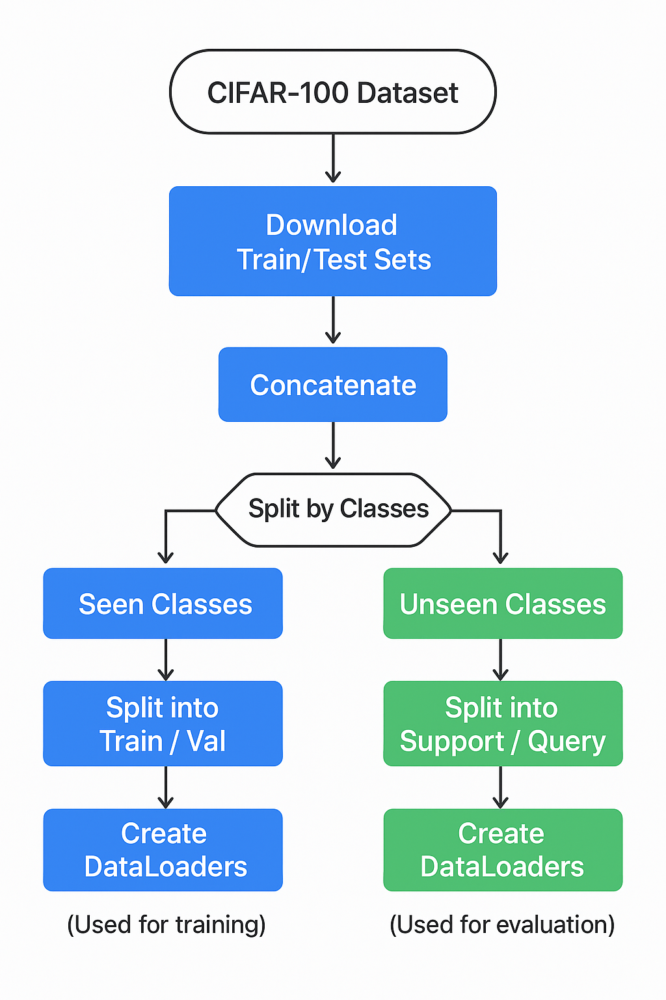

`prepare_data(root,
            num_training_classes,
            pos_num_pairs
            neg_num_pairs,
            batch_size,
            img_size=224)`

Prepare data loaders and few-shot test dataset for CIFAR-100.

Steps:
* Load the full CIFAR-100 dataset (train + test combined).
* Split dataset into seen (training) and unseen (test) classes.
* Apply transformations to unseen/test dataset.
* Generate positive and negative pairs from seen classes for Siamese training.
* Split pairs into training and validation loaders.
* Prepare few-shot support and query sets from unseen classes for evaluation.

Args:
* root (str): Path to CIFAR-100 data folder.
* num_training_classes (int): Number of seen classes used for training.
* pos_num_pairs (int): Number of positive pairs per class for training.
* neg_num_pairs (int): Number of negative pairs per class for training.
* batch_size (int): Batch size for training and validation loaders.
* img_size (int, optional): Size to which images are resized. Defaults to 224.

Returns:
* train_loader (DataLoader): Training loader with positive/negative pairs.
* valid_loader (DataLoader): Validation loader.
* support_loader (DataLoader): Support set loader (few labeled examples per unseen class).
* query_loader (DataLoader): Query set loader (samples to classify using the support set).
    

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 90
pos_num_pairs = 300
neg_num_pairs = 300
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size
)


100%|██████████| 169M/169M [00:04<00:00, 35.8MB/s]


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 54000
[INFO] Unseen dataset size: 6000
[INFO] Test dataset (unseen classes) size: 6000
[INFO] Total pairs generated for training: 53977
[INFO] Number of batches - Train: 760, Validation: 85
Support: torch.Size([10, 3, 224, 224]) torch.Size([10])
Query: torch.Size([5990, 3, 224, 224]) torch.Size([5990])


### 2.3 Visualize pairs

In [ ]:
from helper_functions import visualize_pairs

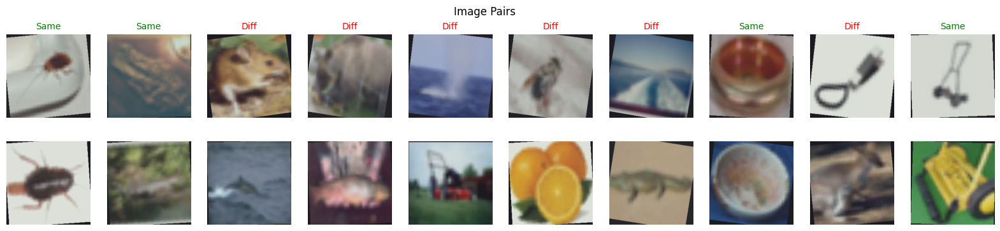

In [ ]:
visualize_pairs(train_loader, n=10)

## 3. Create Siamese Network (ResNet18)

Project Goal
We are not trying to classify an image into its class.
Instead, our task is to determine whether two images are similar or not.

**Model Requirements** :

* Input: a pair of images.

* Output: a single value representing their similarity (e.g., how close or different they are).

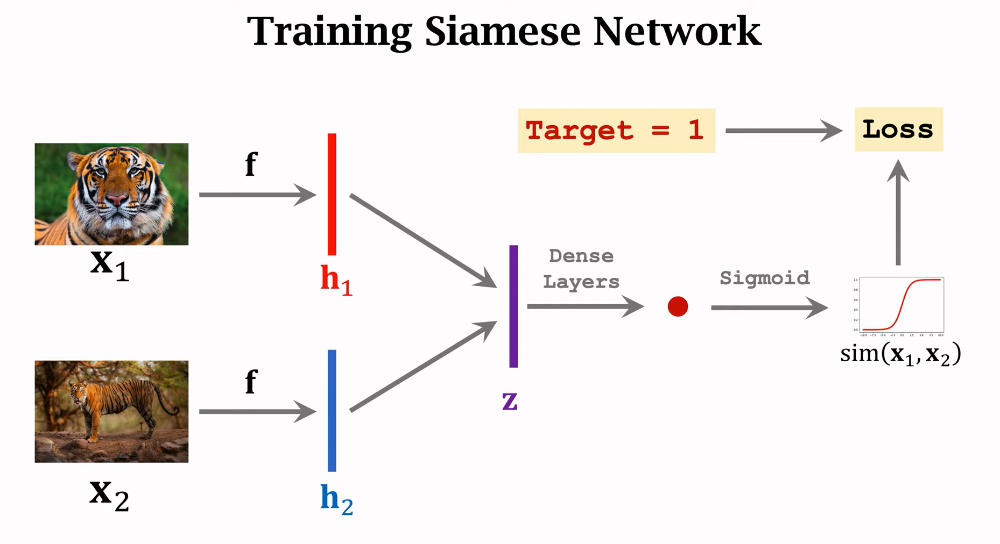

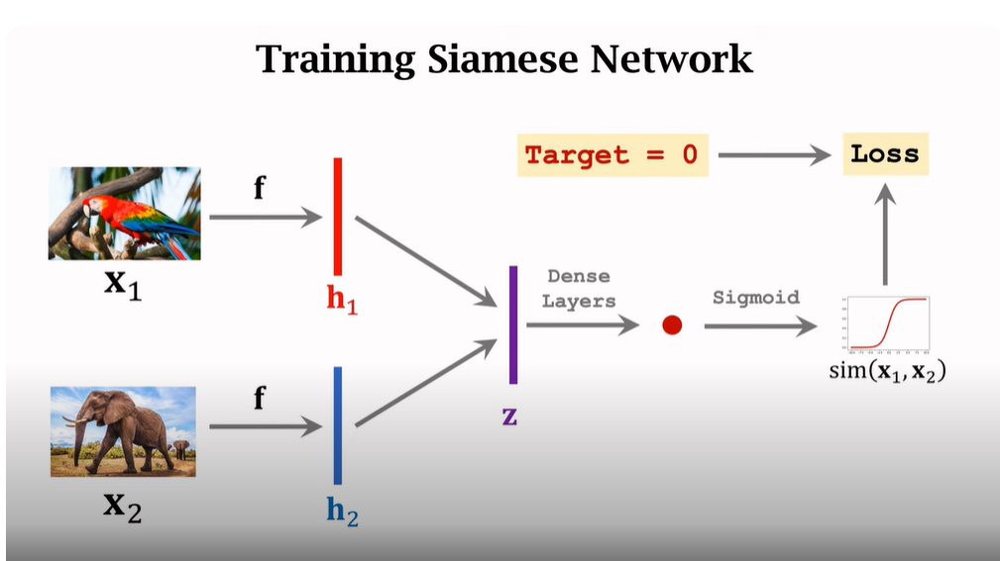

### 3.1 Import Our Model


In [ ]:
'''
            ┌──────────────────── SiameseResNet ────────────────────┐
            │                                                       │
            │              ┌─────────── Shared Encoder ───────────┐ │
x1 ───────► │ ┌──────────► │ Conv + BN + ReLU + MaxPool           │ │
            │ │            │ Layer1 → Layer2 → Layer3 → Layer4    │ │
            │ │            │ GlobalAvgPool (512-dim)              │ │
            │ │            └──────────────────────────────────────┘ │
            │ │                            │                        │
            │ │                            ▼                        │
            │ │                       Embedding Head                │
            │ │                      (Linear→ReLU→Dropout)          │
            │ │                            │                        │
            │ │                            ▼                        │
            │ │                        e1 (128-d)                   │
            │ │                                                     │
x2 ───────► │ └──────────► (same encoder + fc) → e2 (128-d)         │
            │                                                       │
            │   Compute absolute difference: z = |e1 - e2|          │
            │                                                       │
            │   Classifier: Linear(128→1) → logit y                 │
            │                                                       │
            └───────────────────────────────────────────────────────┘

Output: y (similarity score)
'''

'\n            ┌──────────────────── SiameseResNet ────────────────────┐\n            │                                                       │\n            │              ┌─────────── Shared Encoder ───────────┐ │\nx1 ───────► │ ┌──────────► │ Conv + BN + ReLU + MaxPool           │ │\n            │ │            │ Layer1 → Layer2 → Layer3 → Layer4    │ │\n            │ │            │ GlobalAvgPool (512-dim)              │ │\n            │ │            └──────────────────────────────────────┘ │\n            │ │                            │                        │\n            │ │                            ▼                        │\n            │ │                       Embedding Head                │\n            │ │                      (Linear→ReLU→Dropout)          │\n            │ │                            │                        │\n            │ │                            ▼                        │\n            │ │                        e1 (128-d)                   │\n   

In [ ]:
# Import the model from models
from models import SiameseResNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
net = SiameseResNet(embedding_size=128).to(device)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 163MB/s]


- net.unfreeze(layer_number)
- Unfreezes the specified ResNet layers to allow fine-tuning and improve the model's learning capacity.


In [ ]:
# freeze the model until layer 4
net.freeze_until(4)

# show model's summary
net.summary(input_size=(64, 3, 224, 224), verbose=0)

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
SiameseResNet (SiameseResNet)                 [64, 3, 224, 224]    [64, 1]              513,000              Partial
├─Sequential (encoder)                        [64, 3, 224, 224]    [64, 512, 1, 1]      --                   Partial
│    └─Conv2d (0)                             [64, 3, 224, 224]    [64, 64, 112, 112]   (9,408)              False
│    └─BatchNorm2d (1)                        [64, 64, 112, 112]   [64, 64, 112, 112]   (128)                False
│    └─ReLU (2)                               [64, 64, 112, 112]   [64, 64, 112, 112]   --                   --
│    └─MaxPool2d (3)                          [64, 64, 112, 112]   [64, 64, 56, 56]     --                   --
│    └─Sequential (4)                         [64, 64, 56, 56]     [64, 64, 56, 56]     --                   False
│    │    └─BasicBlock (0)                    [64, 64, 56, 56]     [64, 64, 56

## 4. Train the model

###4.1 First Experiment


#### 4.1.1 First attempt
* Model: Resnet18 + BCEWithLogits
* Image Size: 224
* Seen classes: 90
* Number of pairs per class: 300 positive + 300 negative
* Total pairs generated for training: 53979
* Number of epochs: 30
* Early stopping patience: 10

In [ ]:
# Import train and create_writer
from train import train, create_writer

In [ ]:
%%time
# Create loss function
criterion = torch.nn.BCEWithLogitsLoss()
# Create our optimizer
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

# Number of epochs
epochs = 30
# Create writer
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen90",
    model_name="siamese_resnet18",
    extra="30_epochs_300_paris"
)


# train will return:
# history: dict with train/val loss and accuracy per epoch.
# best model.

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=10,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-04/cifar100_seen90/siamese_resnet18/30_epochs_300_paris...


Training:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch [1/30] --> Train Loss: 0.6261, Train Acc: 0.6415 | Val Loss: 0.7223, Val Acc: 0.5714
  ✅ New best model saved
Epoch [2/30] --> Train Loss: 0.5758, Train Acc: 0.6955 | Val Loss: 0.6342, Val Acc: 0.6489
  ✅ New best model saved
Epoch [3/30] --> Train Loss: 0.5513, Train Acc: 0.7176 | Val Loss: 0.5866, Val Acc: 0.7006
  ✅ New best model saved
Epoch [4/30] --> Train Loss: 0.5310, Train Acc: 0.7339 | Val Loss: 0.5528, Val Acc: 0.7297
  ✅ New best model saved
Epoch [5/30] --> Train Loss: 0.5170, Train Acc: 0.7478 | Val Loss: 0.5097, Val Acc: 0.7617
  ✅ New best model saved
Epoch [6/30] --> Train Loss: 0.4994, Train Acc: 0.7598 | Val Loss: 0.5181, Val Acc: 0.7626
  ⚠️ No improvement. Early stop counter: 1/10
Epoch [7/30] --> Train Loss: 0.4889, Train Acc: 0.7684 | Val Loss: 0.4944, Val Acc: 0.7741
  ✅ New best model saved
Epoch [8/30] --> Train Loss: 0.4715, Train Acc: 0.7788 | Val Loss: 0.4720, Val Acc: 0.7875
  ✅ New best model saved
Epoch [9/30] --> Train Loss: 0.4565, Train Acc: 0.7

In [ ]:
# Viewing TensorBoard in Jupyter and Google Colab Notebooks (uncomment to view full TensorBoard instance)
%load_ext tensorboard
%tensorboard --logdir /content/one-short-learning/runs

<IPython.core.display.Javascript object>

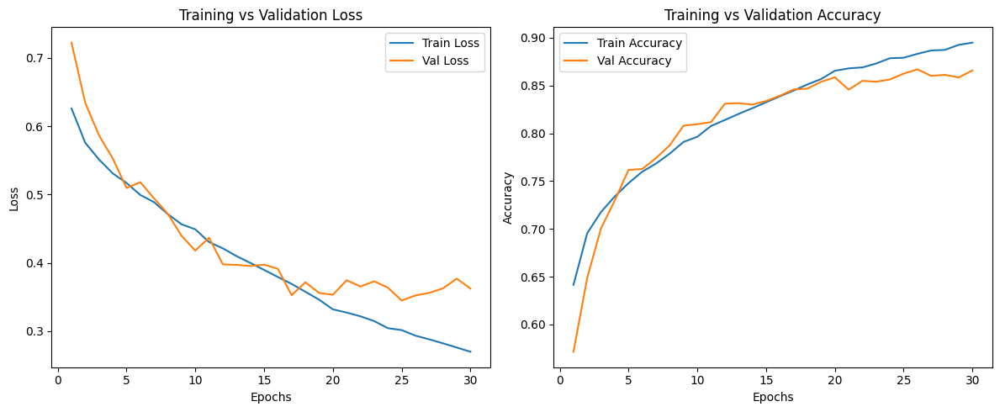

In [ ]:
from helper_functions import plot_history
plot_history(history)

In [ ]:
from train import save_model
from google.colab import files

save_model(best_model, "models", "modelResnet18_v2_25_epochs_400_paris_10p.pth")
# Download the saved model file
files.download("models/modelResnet18_v2_25_epochs_400_paris_10p.pth")

!zip -r runs.zip /content/one-short-learning/runs
files.download("runs.zip")


[INFO] Saving model to: models/modelResnet18_v2_25_epochs_400_paris_10p.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  adding: content/one-short-learning/runs/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/Loss_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/Loss_val/events.out.tfevents.1759392997.73b5972d8485.2172.2 (deflated 42%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/Accuracy_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/Accuracy_val/events.out.tfevents

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

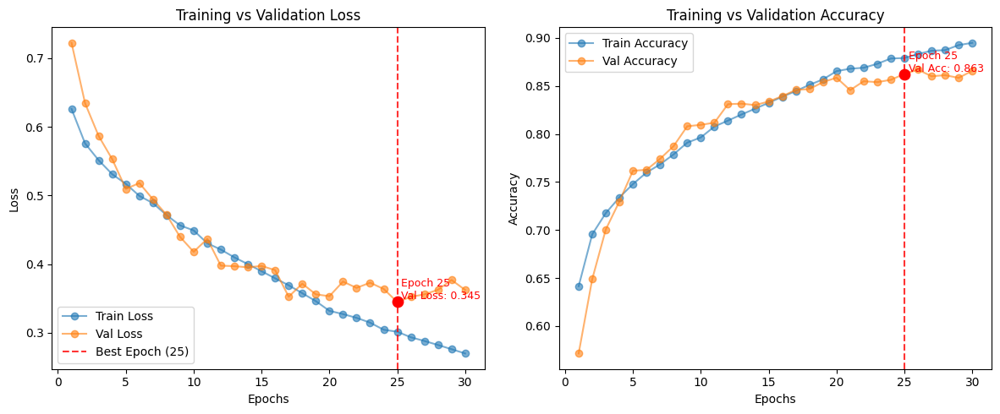

In [ ]:

plot_history(history)


In [ ]:

acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.3693


In [ ]:
checkpoint_path = "/content/modelResnet18_v2_25_epochs_300_paris_10p.pth"

# Load weights
net.load_state_dict(torch.load(checkpoint_path, map_location=device))


<All keys matched successfully>

In [ ]:
from evaluate import evaluate_fewshot_distance
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)


[RESULT] Distance-based Few-shot Accuracy: 0.3907


In [ ]:
import torch
import torch.nn.functional as F


acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)



[RESULT] Cosine similarity Few-shot Accuracy: 0.3830


---

---





#### 4.1.2 Second attempt
* Model: Resnet18 + BCEWithLogits
* Image Size: 224
* Seen classes: 80
* Number of pairs per class: 300 positive + 300 negative
* Total pairs generated for training: 47985
* Number of epochs: 60
* Early stopping patience: 10

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 80
pos_num_pairs = 300
neg_num_pairs = 300
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size
)


100%|██████████| 169M/169M [00:05<00:00, 29.3MB/s]


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 48000
[INFO] Unseen dataset size: 12000
[INFO] Test dataset (unseen classes) size: 12000
[INFO] Total pairs generated for training: 47985
[INFO] Number of batches - Train: 675, Validation: 75
Support: torch.Size([20, 3, 224, 224]) torch.Size([20])
Query: torch.Size([11980, 3, 224, 224]) torch.Size([11980])


In [ ]:
# Import the model from models
from models import SiameseResNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
net = SiameseResNet(embedding_size=128).to(device)
# freeze the model until layer 4
net.freeze_until(4)

# show model's summary
net.summary(input_size=(64, 3, 224, 224), verbose=0)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 241MB/s]


Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
SiameseResNet (SiameseResNet)                 [64, 3, 224, 224]    [64, 1]              513,000              Partial
├─Sequential (encoder)                        [64, 3, 224, 224]    [64, 512, 1, 1]      --                   Partial
│    └─Conv2d (0)                             [64, 3, 224, 224]    [64, 64, 112, 112]   (9,408)              False
│    └─BatchNorm2d (1)                        [64, 64, 112, 112]   [64, 64, 112, 112]   (128)                False
│    └─ReLU (2)                               [64, 64, 112, 112]   [64, 64, 112, 112]   --                   --
│    └─MaxPool2d (3)                          [64, 64, 112, 112]   [64, 64, 56, 56]     --                   --
│    └─Sequential (4)                         [64, 64, 56, 56]     [64, 64, 56, 56]     --                   False
│    │    └─BasicBlock (0)                    [64, 64, 56, 56]     [64, 64, 56

In [ ]:
%%time
# Create loss function
criterion = torch.nn.BCEWithLogitsLoss()
# Create our optimizer
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

# Number of epochs
epochs = 60
# Create writer
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen80",
    model_name="siamese_resnet18",
    extra="60_epochs_300_paris_10p"
)


# train will return:
# history: dict with train/val loss and accuracy per epoch.
# best model.

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=10,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-19/cifar100_seen80/siamese_resnet18/60_epochs_300_paris_10p...


Training:   0%|          | 0/60 [00:00<?, ?it/s]

Epoch [1/60] --> Train Loss: 0.6413, Train Acc: 0.6200 | Val Loss: 0.6041, Val Acc: 0.6376
  ✅ New best model saved
Epoch [2/60] --> Train Loss: 0.6010, Train Acc: 0.6696 | Val Loss: 0.5593, Val Acc: 0.6961
  ✅ New best model saved
Epoch [3/60] --> Train Loss: 0.5799, Train Acc: 0.6916 | Val Loss: 0.5162, Val Acc: 0.7486
  ✅ New best model saved
Epoch [4/60] --> Train Loss: 0.5614, Train Acc: 0.7058 | Val Loss: 0.4848, Val Acc: 0.7726
  ✅ New best model saved
Epoch [5/60] --> Train Loss: 0.5432, Train Acc: 0.7229 | Val Loss: 0.4546, Val Acc: 0.7982
  ✅ New best model saved
Epoch [6/60] --> Train Loss: 0.5281, Train Acc: 0.7352 | Val Loss: 0.4494, Val Acc: 0.7889
  ✅ New best model saved
Epoch [7/60] --> Train Loss: 0.5121, Train Acc: 0.7525 | Val Loss: 0.4346, Val Acc: 0.8016
  ✅ New best model saved
Epoch [8/60] --> Train Loss: 0.5004, Train Acc: 0.7588 | Val Loss: 0.4224, Val Acc: 0.8068
  ✅ New best model saved
Epoch [9/60] --> Train Loss: 0.4873, Train Acc: 0.7700 | Val Loss: 0.405

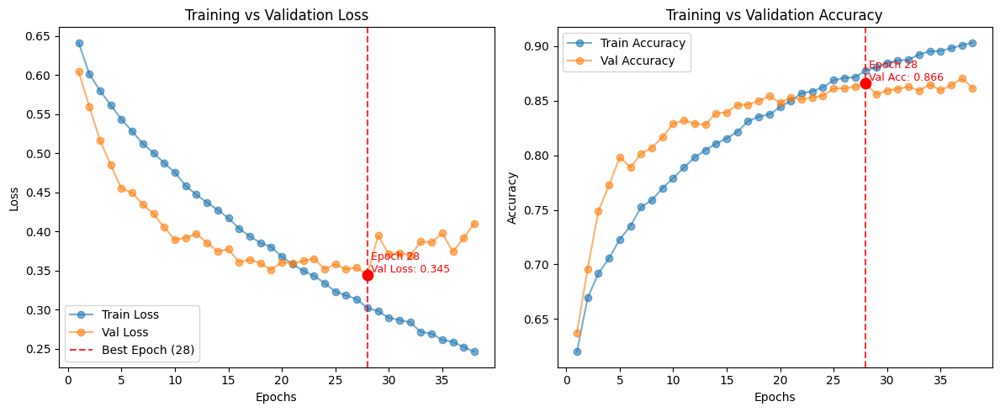

In [ ]:
plot_history_best_model(history)

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)

[RESULT] Distance-based Few-shot Accuracy: 0.3313


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)

[RESULT] Cosine similarity Few-shot Accuracy: 0.3400


#### 4.1.3 Third attempt
* Model: Resnet18 + BCEWithLogits
* Image Size: 224
* Seen classes: 50
* Number of pairs per class: 300 positive + 300 negative
* Total pairs generated for training: 29984
* Number of epochs: 60
* Early stopping patience: 10

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 50
pos_num_pairs = 300
neg_num_pairs = 300
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size
)


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 30000
[INFO] Unseen dataset size: 30000
[INFO] Test dataset (unseen classes) size: 30000
[INFO] Total pairs generated for training: 29984
[INFO] Number of batches - Train: 422, Validation: 47
Support: torch.Size([50, 3, 224, 224]) torch.Size([50])
Query: torch.Size([29950, 3, 224, 224]) torch.Size([29950])


In [ ]:
# Import the model from models
from models import SiameseResNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
net = SiameseResNet(embedding_size=128).to(device)
# freeze the model until layer 4
net.freeze_until(4)

# show model's summary
net.summary(input_size=(64, 3, 224, 224), verbose=0)

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
SiameseResNet (SiameseResNet)                 [64, 3, 224, 224]    [64, 1]              513,000              Partial
├─Sequential (encoder)                        [64, 3, 224, 224]    [64, 512, 1, 1]      --                   Partial
│    └─Conv2d (0)                             [64, 3, 224, 224]    [64, 64, 112, 112]   (9,408)              False
│    └─BatchNorm2d (1)                        [64, 64, 112, 112]   [64, 64, 112, 112]   (128)                False
│    └─ReLU (2)                               [64, 64, 112, 112]   [64, 64, 112, 112]   --                   --
│    └─MaxPool2d (3)                          [64, 64, 112, 112]   [64, 64, 56, 56]     --                   --
│    └─Sequential (4)                         [64, 64, 56, 56]     [64, 64, 56, 56]     --                   False
│    │    └─BasicBlock (0)                    [64, 64, 56, 56]     [64, 64, 56

In [ ]:
%%time
# Create loss function
criterion = torch.nn.BCEWithLogitsLoss()
# Create our optimizer
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

# Number of epochs
epochs = 60
# Create writer
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen50",
    model_name="siamese_resnet18",
    extra="60_epochs_300_paris_15p"
)


# train will return:
# history: dict with train/val loss and accuracy per epoch.
# best model.

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=15,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-19/cifar100_seen50/siamese_resnet18/60_epochs_300_paris_15p...


Training:   0%|          | 0/60 [00:00<?, ?it/s]

Epoch [1/60] --> Train Loss: 0.6215, Train Acc: 0.6474 | Val Loss: 0.6163, Val Acc: 0.6418
  ✅ New best model saved
Epoch [2/60] --> Train Loss: 0.5660, Train Acc: 0.7014 | Val Loss: 0.5990, Val Acc: 0.6988
  ✅ New best model saved
Epoch [3/60] --> Train Loss: 0.5432, Train Acc: 0.7244 | Val Loss: 0.5616, Val Acc: 0.7295
  ✅ New best model saved
Epoch [4/60] --> Train Loss: 0.5233, Train Acc: 0.7387 | Val Loss: 0.5090, Val Acc: 0.7542
  ✅ New best model saved
Epoch [5/60] --> Train Loss: 0.5101, Train Acc: 0.7499 | Val Loss: 0.5127, Val Acc: 0.7618
  ⚠️ No improvement. Early stop counter: 1/15
Epoch [6/60] --> Train Loss: 0.4949, Train Acc: 0.7605 | Val Loss: 0.5042, Val Acc: 0.7685
  ✅ New best model saved
Epoch [7/60] --> Train Loss: 0.4849, Train Acc: 0.7668 | Val Loss: 0.4587, Val Acc: 0.7915
  ✅ New best model saved
Epoch [8/60] --> Train Loss: 0.4635, Train Acc: 0.7825 | Val Loss: 0.4712, Val Acc: 0.7942
  ⚠️ No improvement. Early stop counter: 1/15
Epoch [9/60] --> Train Loss: 0

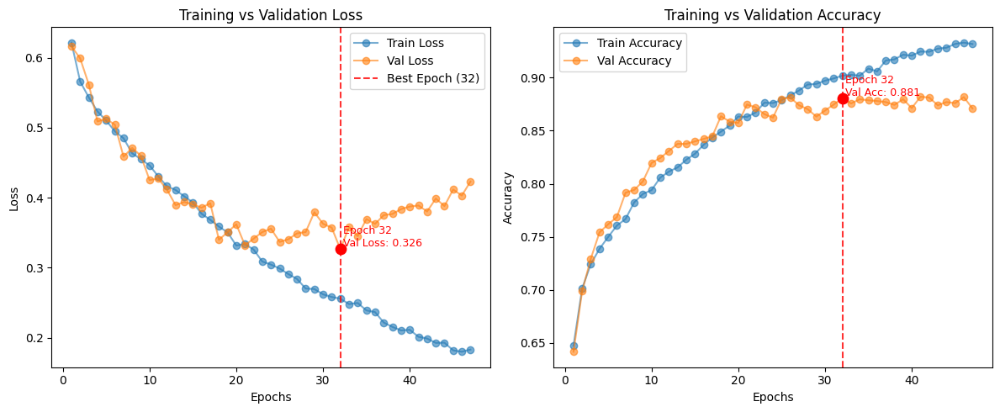

In [ ]:
plot_history_best_model(history)

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)

[RESULT] Distance-based Few-shot Accuracy: 0.1226


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)

[RESULT] Cosine similarity Few-shot Accuracy: 0.1251


### 4.2 Second Experiment


#### 4.2.1 First attempt
* Model: Resnet18  + BCEWithLogits. (freeze all layers)
* Image Size: 224 (original)
* Seen classes: 90
* Number of pairs per class: 100 positive + 100 negative
* Total pairs generated for training: 17998
* Number of epochs: 50
* Early stopping patience: 10

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 90
pos_num_pairs = 100
neg_num_pairs = 100
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size
)


100%|██████████| 169M/169M [00:18<00:00, 9.36MB/s]


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 54000
[INFO] Unseen dataset size: 6000
[INFO] Test dataset (unseen classes) size: 6000
[INFO] Total pairs generated for training: 17997
[INFO] Number of batches - Train: 254, Validation: 29
Support: torch.Size([10, 3, 224, 224]) torch.Size([10])
Query: torch.Size([5990, 3, 224, 224]) torch.Size([5990])


In [ ]:
net = SiameseResNet(embedding_size=128).to(device)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 155MB/s]


In [ ]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 50
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen90",
    model_name="siamese_resnet18",
    extra="50_epochs_100_paris_10p"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=10,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/50_epochs_400_paris_10p...


Training:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch [1/50] --> Train Loss: 0.6658, Train Acc: 0.5907 | Val Loss: 0.6566, Val Acc: 0.6014
  ✅ New best model saved
Epoch [2/50] --> Train Loss: 0.6315, Train Acc: 0.6365 | Val Loss: 0.6388, Val Acc: 0.6404
  ✅ New best model saved
Epoch [3/50] --> Train Loss: 0.6134, Train Acc: 0.6617 | Val Loss: 0.6659, Val Acc: 0.6248
  ⚠️ No improvement. Early stop counter: 1/10
Epoch [4/50] --> Train Loss: 0.6044, Train Acc: 0.6644 | Val Loss: 0.6293, Val Acc: 0.6387
  ✅ New best model saved
Epoch [5/50] --> Train Loss: 0.5903, Train Acc: 0.6806 | Val Loss: 0.6023, Val Acc: 0.6565
  ✅ New best model saved
Epoch [6/50] --> Train Loss: 0.5844, Train Acc: 0.6868 | Val Loss: 0.6212, Val Acc: 0.6604
  ⚠️ No improvement. Early stop counter: 1/10
Epoch [7/50] --> Train Loss: 0.5714, Train Acc: 0.6986 | Val Loss: 0.6100, Val Acc: 0.6882
  ⚠️ No improvement. Early stop counter: 2/10
Epoch [8/50] --> Train Loss: 0.5637, Train Acc: 0.7058 | Val Loss: 0.5919, Val Acc: 0.6826
  ✅ New best model saved
Epoch [9/

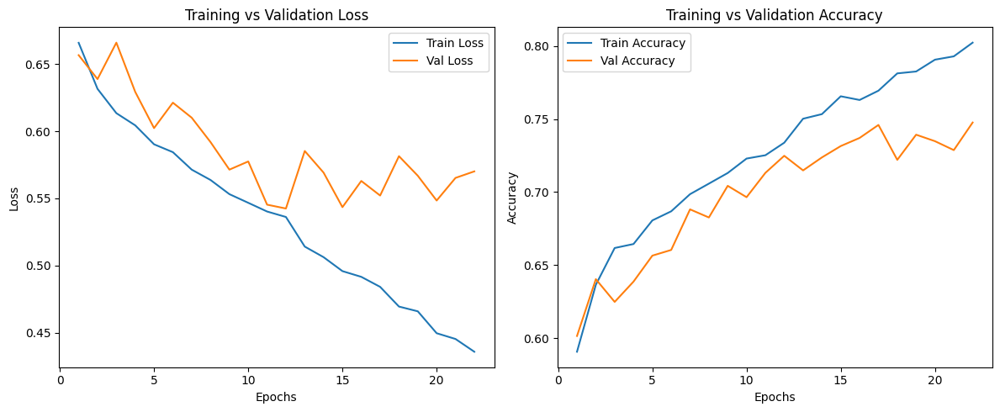

In [ ]:
from helper_functions import plot_history
plot_history(history)

In [ ]:
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.3888


In [ ]:
checkpoint_path = "/content/modelv2_100pairs_l4.pth"

# Load weights
net.load_state_dict(torch.load(checkpoint_path, map_location=device))


<All keys matched successfully>

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)

[RESULT] Distance-based Few-shot Accuracy: 0.3731


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)

[RESULT] Cosine similarity Few-shot Accuracy: 0.4033


In [ ]:
from train import save_model
from google.colab import files

save_model(best_model, "models", "modelv2_100pairs_l4.pth")
# Download the saved model file
files.download("models/modelv2_100pairs_l4.pth")

!zip -r runs.zip /content/one-short-learning/runs
files.download("runs.zip")


[INFO] Saving model to: models/modelv2_100pairs_l4.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  adding: content/one-short-learning/runs/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Accuracy_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Accuracy_val/events.out.tfevents.1759489314.069e36433463.2869.32 (deflated 12%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Loss_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Loss_va

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### 4.2.2 I think i should repeat it with more patient

In [ ]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 50
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen90",
    model_name="siamese_resnet18",
    extra="50_epochs_100_paris_20p"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=20,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-16/cifar100_seen90/siamese_resnet18/50_epochs_100_paris_20p...


Training:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch [1/50] --> Train Loss: 0.6915, Train Acc: 0.5335 | Val Loss: 0.6723, Val Acc: 0.5481
  ✅ New best model saved
Epoch [2/50] --> Train Loss: 0.6699, Train Acc: 0.5812 | Val Loss: 0.6522, Val Acc: 0.5470
  ✅ New best model saved
Epoch [3/50] --> Train Loss: 0.6597, Train Acc: 0.5930 | Val Loss: 0.6387, Val Acc: 0.5909
  ✅ New best model saved
Epoch [4/50] --> Train Loss: 0.6509, Train Acc: 0.6125 | Val Loss: 0.6371, Val Acc: 0.5825
  ✅ New best model saved
Epoch [5/50] --> Train Loss: 0.6507, Train Acc: 0.6132 | Val Loss: 0.6253, Val Acc: 0.6220
  ✅ New best model saved
Epoch [6/50] --> Train Loss: 0.6422, Train Acc: 0.6183 | Val Loss: 0.6202, Val Acc: 0.6348
  ✅ New best model saved
Epoch [7/50] --> Train Loss: 0.6423, Train Acc: 0.6209 | Val Loss: 0.6126, Val Acc: 0.6837
  ✅ New best model saved
Epoch [8/50] --> Train Loss: 0.6409, Train Acc: 0.6233 | Val Loss: 0.6066, Val Acc: 0.6748
  ✅ New best model saved
Epoch [9/50] --> Train Loss: 0.6321, Train Acc: 0.6349 | Val Loss: 0.603

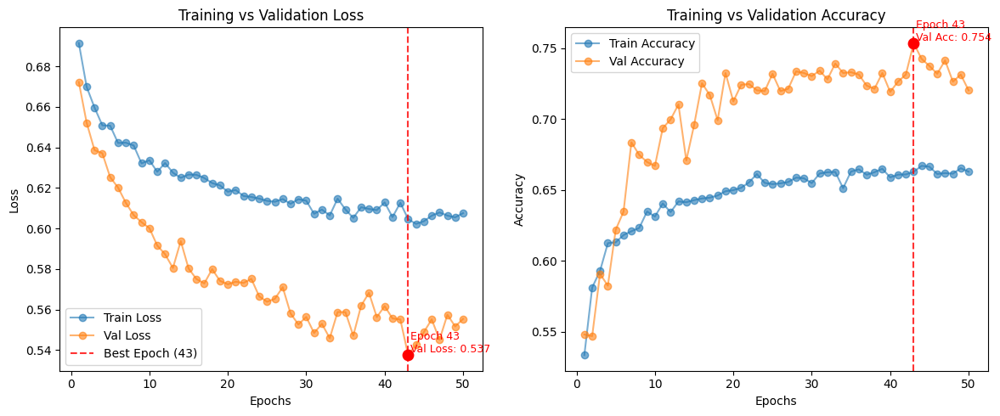

In [ ]:
plot_history_best_model(history)

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)

[RESULT] Distance-based Few-shot Accuracy: 0.3978


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)

[RESULT] Cosine similarity Few-shot Accuracy: 0.4175


#### 4.2.3 Third attempt
* Model: Resnet18 + BCEWithLogits (freeze alllayers)
* Image Size: 224
* Seen classes: 80
* Number of pairs per class: 100 positive + 100 negative
* Total pairs generated for training: 15998
* Number of epochs: 50
* Early stopping patience: 10

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 80
pos_num_pairs = 100
neg_num_pairs = 100
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size
)


100%|██████████| 169M/169M [00:18<00:00, 9.32MB/s]


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 48000
[INFO] Unseen dataset size: 12000
[INFO] Test dataset (unseen classes) size: 12000
[INFO] Total pairs generated for training: 15998
[INFO] Number of batches - Train: 225, Validation: 25
Support: torch.Size([20, 3, 224, 224]) torch.Size([20])
Query: torch.Size([11980, 3, 224, 224]) torch.Size([11980])


In [ ]:
# Import train and create_writer
from train import train, create_writer
net = SiameseResNet(embedding_size=128).to(device)
net.summary(input_size=(64, 3, 224, 224), verbose=0)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 252MB/s]


Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
SiameseResNet (SiameseResNet)                 [64, 3, 224, 224]    [64, 1]              513,000              Partial
├─Sequential (encoder)                        [64, 3, 224, 224]    [64, 512, 1, 1]      --                   False
│    └─Conv2d (0)                             [64, 3, 224, 224]    [64, 64, 112, 112]   (9,408)              False
│    └─BatchNorm2d (1)                        [64, 64, 112, 112]   [64, 64, 112, 112]   (128)                False
│    └─ReLU (2)                               [64, 64, 112, 112]   [64, 64, 112, 112]   --                   --
│    └─MaxPool2d (3)                          [64, 64, 112, 112]   [64, 64, 56, 56]     --                   --
│    └─Sequential (4)                         [64, 64, 56, 56]     [64, 64, 56, 56]     --                   False
│    │    └─BasicBlock (0)                    [64, 64, 56, 56]     [64, 64, 56, 

In [ ]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 50
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen80",
    model_name="siamese_resnet18",
    extra="50_epochs_100_paris_10p_freeze"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=10,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-18/cifar100_seen80/siamese_resnet18/50_epochs_100_paris_10p_freeze...


Training:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch [1/50] --> Train Loss: 0.6898, Train Acc: 0.5355 | Val Loss: 0.6705, Val Acc: 0.5366
  ✅ New best model saved
Epoch [2/50] --> Train Loss: 0.6693, Train Acc: 0.5796 | Val Loss: 0.6622, Val Acc: 0.5285
  ✅ New best model saved
Epoch [3/50] --> Train Loss: 0.6572, Train Acc: 0.6021 | Val Loss: 0.6538, Val Acc: 0.5604
  ✅ New best model saved
Epoch [4/50] --> Train Loss: 0.6541, Train Acc: 0.6088 | Val Loss: 0.6453, Val Acc: 0.5578
  ✅ New best model saved
Epoch [5/50] --> Train Loss: 0.6473, Train Acc: 0.6191 | Val Loss: 0.6558, Val Acc: 0.5604
  ⚠️ No improvement. Early stop counter: 1/10
Epoch [6/50] --> Train Loss: 0.6485, Train Acc: 0.6132 | Val Loss: 0.6296, Val Acc: 0.6191
  ✅ New best model saved
Epoch [7/50] --> Train Loss: 0.6395, Train Acc: 0.6200 | Val Loss: 0.6206, Val Acc: 0.6373
  ✅ New best model saved
Epoch [8/50] --> Train Loss: 0.6424, Train Acc: 0.6243 | Val Loss: 0.6215, Val Acc: 0.6341
  ⚠️ No improvement. Early stop counter: 1/10
Epoch [9/50] --> Train Loss: 0

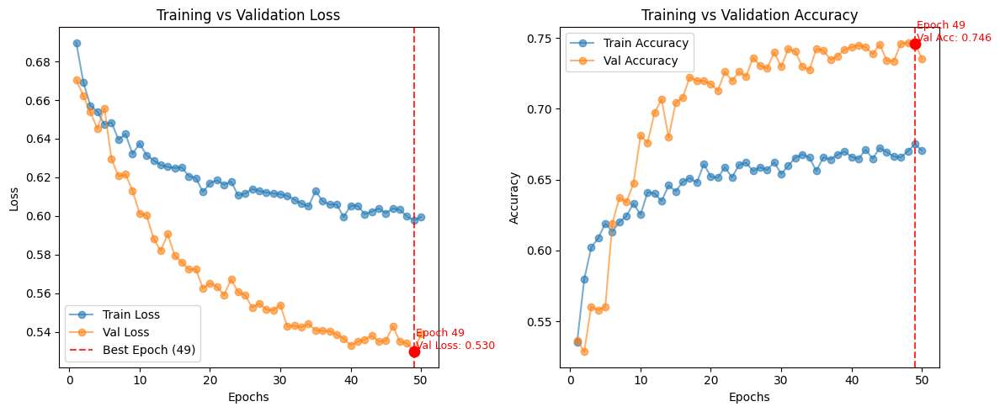

In [ ]:
plot_history_best_model(history)

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)

[RESULT] Distance-based Few-shot Accuracy: 0.3129


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)

[RESULT] Cosine similarity Few-shot Accuracy: 0.3237


In [ ]:
from evaluate import evaluate_fewshot
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=64)


KeyboardInterrupt: 

#### 4.2.4 fourth attempt
* Model: Resnet18 + BCEWithLogits (freeze alllayers)
* Image Size: 224
* Seen classes: 50
* Number of pairs per class: 100 positive + 100 negative
* Total pairs generated for training: 10000
* Number of epochs: 100
* Early stopping patience: 10

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 50
pos_num_pairs = 100
neg_num_pairs = 100
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size
)


100%|██████████| 169M/169M [00:13<00:00, 12.3MB/s]


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 30000
[INFO] Unseen dataset size: 30000
[INFO] Test dataset (unseen classes) size: 30000
[INFO] Total pairs generated for training: 10000
[INFO] Number of batches - Train: 141, Validation: 16
Support: torch.Size([50, 3, 224, 224]) torch.Size([50])
Query: torch.Size([29950, 3, 224, 224]) torch.Size([29950])


In [ ]:
# Import train and create_writer
from train import train, create_writer
net = SiameseResNet(embedding_size=128).to(device)
net.summary(input_size=(64, 3, 224, 224), verbose=0)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 268MB/s]


Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
SiameseResNet (SiameseResNet)                 [64, 3, 224, 224]    [64, 1]              513,000              Partial
├─Sequential (encoder)                        [64, 3, 224, 224]    [64, 512, 1, 1]      --                   False
│    └─Conv2d (0)                             [64, 3, 224, 224]    [64, 64, 112, 112]   (9,408)              False
│    └─BatchNorm2d (1)                        [64, 64, 112, 112]   [64, 64, 112, 112]   (128)                False
│    └─ReLU (2)                               [64, 64, 112, 112]   [64, 64, 112, 112]   --                   --
│    └─MaxPool2d (3)                          [64, 64, 112, 112]   [64, 64, 56, 56]     --                   --
│    └─Sequential (4)                         [64, 64, 56, 56]     [64, 64, 56, 56]     --                   False
│    │    └─BasicBlock (0)                    [64, 64, 56, 56]     [64, 64, 56, 

In [ ]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 100
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen50",
    model_name="siamese_resnet18",
    extra="100_epochs_100_paris_15p_freeze"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=15,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-18/cifar100_seen50/siamese_resnet18/100_epochs_100_paris_15p_freeze...


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch [1/100] --> Train Loss: 0.6929, Train Acc: 0.5270 | Val Loss: 0.6665, Val Acc: 0.6450
  ✅ New best model saved
Epoch [2/100] --> Train Loss: 0.6728, Train Acc: 0.5726 | Val Loss: 0.6337, Val Acc: 0.6020
  ✅ New best model saved
Epoch [3/100] --> Train Loss: 0.6551, Train Acc: 0.6041 | Val Loss: 0.6241, Val Acc: 0.5860
  ✅ New best model saved
Epoch [4/100] --> Train Loss: 0.6466, Train Acc: 0.6198 | Val Loss: 0.6158, Val Acc: 0.6020
  ✅ New best model saved
Epoch [5/100] --> Train Loss: 0.6356, Train Acc: 0.6293 | Val Loss: 0.6066, Val Acc: 0.6200
  ✅ New best model saved
Epoch [6/100] --> Train Loss: 0.6292, Train Acc: 0.6339 | Val Loss: 0.5857, Val Acc: 0.6690
  ✅ New best model saved
Epoch [7/100] --> Train Loss: 0.6212, Train Acc: 0.6507 | Val Loss: 0.6003, Val Acc: 0.6270
  ⚠️ No improvement. Early stop counter: 1/15
Epoch [8/100] --> Train Loss: 0.6237, Train Acc: 0.6436 | Val Loss: 0.5746, Val Acc: 0.6890
  ✅ New best model saved
Epoch [9/100] --> Train Loss: 0.6125, Train

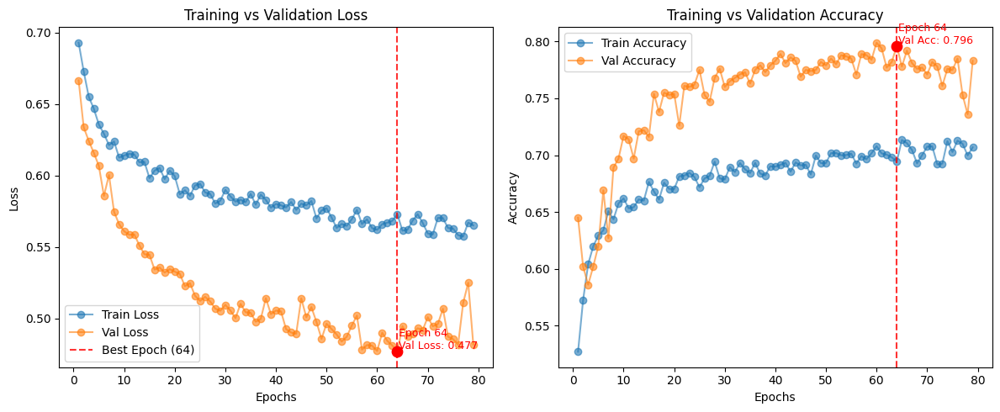

In [ ]:
plot_history_best_model(history)

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)

[RESULT] Distance-based Few-shot Accuracy: 0.1396


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)

[RESULT] Cosine similarity Few-shot Accuracy: 0.1455


### 4.3 third experiment with CNN


#### 4.3.1 first attempt
* Model: CNN
* Image Size: 32 (original)
* Seen classes: 90
* Number of pairs per class: 400 positive + 400 negative
* Total pairs generated for training: 71956
* Number of epochs: 100
* Early stopping patience: 15

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 90
pos_num_pairs = 400
neg_num_pairs = 400
batch_size = 64
img_size = 32

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


100%|██████████| 169M/169M [00:13<00:00, 12.3MB/s]


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 54000
[INFO] Unseen dataset size: 6000
[INFO] Test dataset (unseen classes) size: 6000
[INFO] Total pairs generated for training: 71967
[INFO] Number of batches - Train: 1013, Validation: 113
Support: torch.Size([10, 3, 32, 32]) torch.Size([10])
Query: torch.Size([5990, 3, 32, 32]) torch.Size([5990])


In [ ]:
import torch
import torch.nn as nn

# -------------------------------
# CNN Encoder for 32x32 images
# -------------------------------
class CNNEncoder(nn.Module):
    def __init__(self, embedding_dim=128):
        super().__init__()
        self.conv = nn.Sequential(
            # Input: 3x32x32
            nn.Conv2d(3, 64, kernel_size=5, stride=1, padding=2),  # -> 64x32x32
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),  # -> 64x16x16

            nn.Conv2d(64, 128, kernel_size=5, stride=1, padding=2), # -> 128x16x16
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),  # -> 128x8x8

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1), # -> 256x8x8
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2)  # -> 256x4x4
        )

        self.fc = nn.Sequential(
            nn.Linear(256*4*4, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, embedding_dim)  # -> final embedding
        )


    def forward(self, x):
        x = self.conv(x)
        x = x.view(x.size(0), -1)  # flatten
        x = self.fc(x)
        return x


# -------------------------------
# Siamese Network
# -------------------------------
class SiameseCNN(nn.Module):
    def __init__(self, embedding_dim=128):
        super().__init__()
        self.encoder = CNNEncoder(embedding_dim)
        self.classifier = nn.Linear(embedding_dim, 1)  # single logit for BCE

    def forward_once(self, x):
        return self.encoder(x)

    def forward(self, x1, x2):
        e1 = self.forward_once(x1)
        e2 = self.forward_once(x2)

        diff = torch.abs(e1 - e2)
        out = self.classifier(diff)  # logits for BCEWithLogitsLoss
        return out


In [ ]:
net = SiameseCNN(embedding_dim=128).to(device)
summary(net,
              [(1, 3, 32, 32), (1, 3, 32, 32)],  # two inputs
        verbose=0,
                col_names=["input_size", "output_size", "num_params", "trainable"],
                col_width=20,
                row_settings=["var_names"])


Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
SiameseCNN (SiameseCNN)                  [1, 3, 32, 32]       [1, 1]               --                   True
├─CNNEncoder (encoder)                   [1, 3, 32, 32]       [1, 128]             --                   True
│    └─Sequential (conv)                 [1, 3, 32, 32]       [1, 256, 4, 4]       --                   True
│    │    └─Conv2d (0)                   [1, 3, 32, 32]       [1, 64, 32, 32]      4,864                True
│    │    └─BatchNorm2d (1)              [1, 64, 32, 32]      [1, 64, 32, 32]      128                  True
│    │    └─ReLU (2)                     [1, 64, 32, 32]      [1, 64, 32, 32]      --                   --
│    │    └─MaxPool2d (3)                [1, 64, 32, 32]      [1, 64, 16, 16]      --                   --
│    │    └─Conv2d (4)                   [1, 64, 16, 16]      [1, 128, 16, 16]     204,928              True
│    │    └─BatchN

In [ ]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 130
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen90",
    model_name="CNN",
    extra="130_epochs_250_paris_20p"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=20,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-13/cifar100_seen90/CNN/130_epochs_250_paris_20p...


Training:   0%|          | 0/130 [00:00<?, ?it/s]

Epoch [1/130] --> Train Loss: 0.6968, Train Acc: 0.5441 | Val Loss: 0.6896, Val Acc: 0.5229
  ✅ New best model saved
Epoch [2/130] --> Train Loss: 0.6781, Train Acc: 0.5669 | Val Loss: 0.6714, Val Acc: 0.5825
  ✅ New best model saved
Epoch [3/130] --> Train Loss: 0.6732, Train Acc: 0.5754 | Val Loss: 0.6676, Val Acc: 0.5994
  ✅ New best model saved
Epoch [4/130] --> Train Loss: 0.6700, Train Acc: 0.5805 | Val Loss: 0.6715, Val Acc: 0.5820
  ⚠️ No improvement. Early stop counter: 1/20
Epoch [5/130] --> Train Loss: 0.6666, Train Acc: 0.5864 | Val Loss: 0.6585, Val Acc: 0.6067
  ✅ New best model saved
Epoch [6/130] --> Train Loss: 0.6635, Train Acc: 0.5907 | Val Loss: 0.6523, Val Acc: 0.6149
  ✅ New best model saved
Epoch [7/130] --> Train Loss: 0.6623, Train Acc: 0.5971 | Val Loss: 0.6547, Val Acc: 0.6209
  ⚠️ No improvement. Early stop counter: 1/20
Epoch [8/130] --> Train Loss: 0.6592, Train Acc: 0.6026 | Val Loss: 0.6616, Val Acc: 0.6007
  ⚠️ No improvement. Early stop counter: 2/20
E

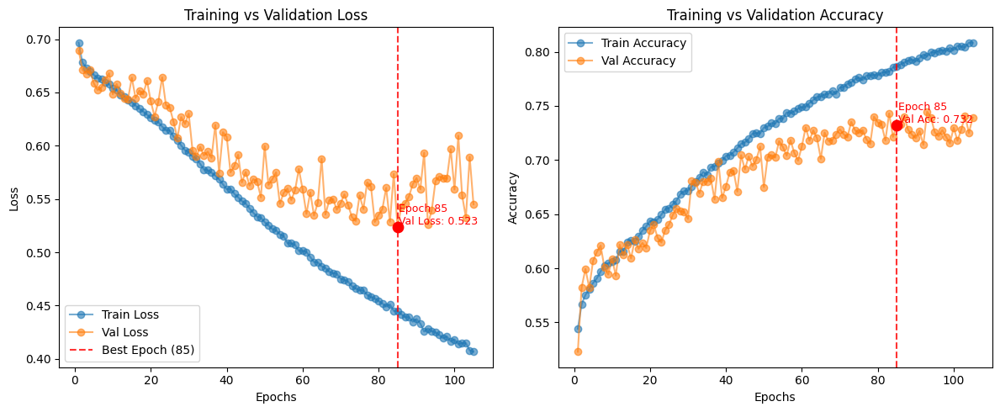

In [ ]:
plot_history_best_model(history)

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)

[RESULT] Distance-based Few-shot Accuracy: 0.2963


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)

[RESULT] Cosine similarity Few-shot Accuracy: 0.3477


In [ ]:
from train import save_model
from google.colab import files

save_model(best_model, "models", "model_CNN_400pairs_15.pth")
# Download the saved model file
files.download("models/model_CNN_400pairs_15.pth")

!zip -r runs.zip /content/one-short-learning/runs
files.download("runs.zip")


In [ ]:
from evaluate import evaluate_fewshot
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.3000


In [ ]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 150
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen90",
    model_name="CNN",
    extra="150_epochs_400_paris_25p"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=25,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-13/cifar100_seen90/CNN/150_epochs_400_paris_25p...


Training:   0%|          | 0/150 [00:00<?, ?it/s]

Epoch [1/150] --> Train Loss: 0.6891, Train Acc: 0.5533 | Val Loss: 0.6815, Val Acc: 0.5385
  ✅ New best model saved
Epoch [2/150] --> Train Loss: 0.6723, Train Acc: 0.5781 | Val Loss: 0.7050, Val Acc: 0.5441
  ⚠️ No improvement. Early stop counter: 1/25
Epoch [3/150] --> Train Loss: 0.6668, Train Acc: 0.5905 | Val Loss: 0.6726, Val Acc: 0.5796
  ✅ New best model saved
Epoch [4/150] --> Train Loss: 0.6643, Train Acc: 0.5932 | Val Loss: 0.6633, Val Acc: 0.5971
  ✅ New best model saved
Epoch [5/150] --> Train Loss: 0.6606, Train Acc: 0.5983 | Val Loss: 0.6582, Val Acc: 0.6006
  ✅ New best model saved
Epoch [6/150] --> Train Loss: 0.6570, Train Acc: 0.6051 | Val Loss: 0.6451, Val Acc: 0.6263
  ✅ New best model saved
Epoch [7/150] --> Train Loss: 0.6522, Train Acc: 0.6095 | Val Loss: 0.6534, Val Acc: 0.6102
  ⚠️ No improvement. Early stop counter: 1/25
Epoch [8/150] --> Train Loss: 0.6496, Train Acc: 0.6120 | Val Loss: 0.6464, Val Acc: 0.6174
  ⚠️ No improvement. Early stop counter: 2/25
E

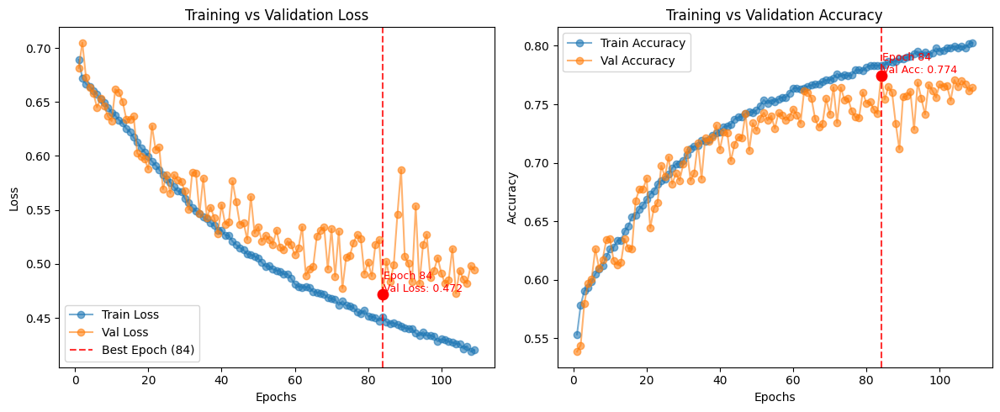

In [ ]:
plot_history_best_model(history)

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)

[RESULT] Distance-based Few-shot Accuracy: 0.3175


In [ ]:
from train import save_model
from google.colab import files

save_model(best_model, "models", "model_CNN_400pairs_15.pth")
# Download the saved model file
files.download("models/model_CNN_400pairs_15.pth")

!zip -r runs.zip /content/one-short-learning/runs
files.download("runs.zip")


[INFO] Saving model to: models/model_CNN_400pairs_15.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

updating: content/one-short-learning/runs/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Accuracy_val/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Accuracy_val/events.out.tfevents.1759489314.069e36433463.2869.32 (deflated 12%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Loss_val/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Loss_va

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)

[RESULT] Distance-based Few-shot Accuracy: 0.3175


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)

[RESULT] Cosine similarity Few-shot Accuracy: 0.3603


In [ ]:
from evaluate import evaluate_fewshot
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.3083


#### 4.3.2 Second experiment
* Model: CNN
* Image Size: 32 (original)
* Seen classes: 80
* Number of pairs per class: 400 positive + 400 negative
* Total pairs generated for training: 63967
* Number of epochs: 130
* Early stopping patience: 15


In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 80
pos_num_pairs = 400
neg_num_pairs = 400
batch_size = 64
img_size = 32

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


100%|██████████| 169M/169M [00:14<00:00, 11.9MB/s]


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 48000
[INFO] Unseen dataset size: 12000
[INFO] Test dataset (unseen classes) size: 12000
[INFO] Total pairs generated for training: 63967
[INFO] Number of batches - Train: 900, Validation: 100
Support: torch.Size([20, 3, 32, 32]) torch.Size([20])
Query: torch.Size([11980, 3, 32, 32]) torch.Size([11980])


In [ ]:
#from models import SiameseCNN
net = SiameseCNN(embedding_dim=128).to(device)
net.summary(input_size=(64, 3, 32, 32), verbose=0)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
SiameseCNN (SiameseCNN)                  [64, 3, 32, 32]      [64, 1]              --                   True
├─CNNEncoder (encoder)                   [64, 3, 32, 32]      [64, 128]            --                   True
│    └─Sequential (conv)                 [64, 3, 32, 32]      [64, 256, 4, 4]      --                   True
│    │    └─Conv2d (0)                   [64, 3, 32, 32]      [64, 64, 32, 32]     4,864                True
│    │    └─BatchNorm2d (1)              [64, 64, 32, 32]     [64, 64, 32, 32]     128                  True
│    │    └─ReLU (2)                     [64, 64, 32, 32]     [64, 64, 32, 32]     --                   --
│    │    └─MaxPool2d (3)                [64, 64, 32, 32]     [64, 64, 16, 16]     --                   --
│    │    └─Conv2d (4)                   [64, 64, 16, 16]     [64, 128, 16, 16]    204,928              True
│    │    └─BatchN

In [ ]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 140
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen80",
    model_name="CNN",
    extra="140_epochs_400_paris_15p"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=15,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-15/cifar100_seen80/CNN/140_epochs_400_paris_15p...


Training:   0%|          | 0/140 [00:00<?, ?it/s]

Epoch [1/140] --> Train Loss: 0.6961, Train Acc: 0.5310 | Val Loss: 0.6851, Val Acc: 0.5455
  ✅ New best model saved
Epoch [2/140] --> Train Loss: 0.6841, Train Acc: 0.5539 | Val Loss: 0.6797, Val Acc: 0.5685
  ✅ New best model saved
Epoch [3/140] --> Train Loss: 0.6783, Train Acc: 0.5687 | Val Loss: 0.6680, Val Acc: 0.5941
  ✅ New best model saved
Epoch [4/140] --> Train Loss: 0.6730, Train Acc: 0.5787 | Val Loss: 0.6662, Val Acc: 0.5955
  ✅ New best model saved
Epoch [5/140] --> Train Loss: 0.6701, Train Acc: 0.5837 | Val Loss: 0.6639, Val Acc: 0.5960
  ✅ New best model saved
Epoch [6/140] --> Train Loss: 0.6675, Train Acc: 0.5886 | Val Loss: 0.6602, Val Acc: 0.5999
  ✅ New best model saved
Epoch [7/140] --> Train Loss: 0.6614, Train Acc: 0.5984 | Val Loss: 0.6597, Val Acc: 0.6046
  ✅ New best model saved
Epoch [8/140] --> Train Loss: 0.6600, Train Acc: 0.5972 | Val Loss: 0.6676, Val Acc: 0.5974
  ⚠️ No improvement. Early stop counter: 1/15
Epoch [9/140] --> Train Loss: 0.6564, Train

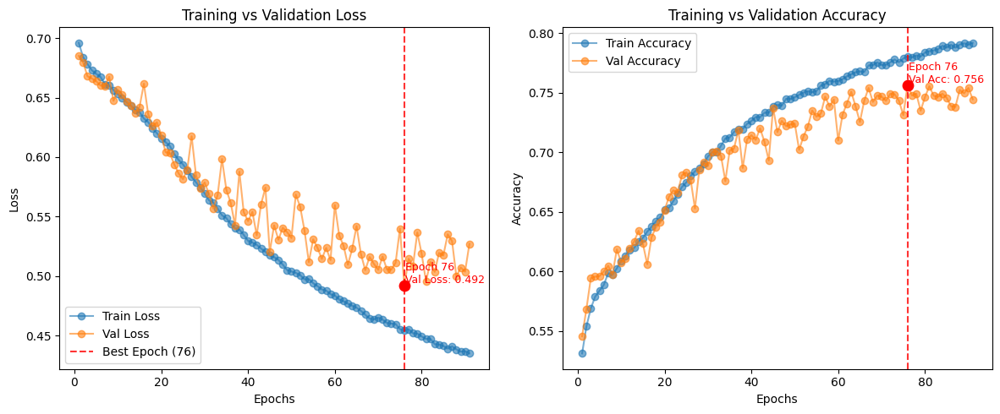

In [ ]:
plot_history_best_model(history)

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)


[RESULT] Distance-based Few-shot Accuracy: 0.2339


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)


[RESULT] Cosine similarity Few-shot Accuracy: 0.2615


In [ ]:
from evaluate import evaluate_fewshot
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.2026


#### 4.3.3 Third attempt
* Model: CNN
* Image Size: 32 (original)
* Seen classes: 50
* Number of pairs per class: 500 positive + 500 negative
* Total pairs generated for training: 49963
* Number of epochs: 150
* Early stopping patience: 20

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 50
pos_num_pairs = 500
neg_num_pairs = 500
batch_size = 64
img_size = 32

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


100%|██████████| 169M/169M [00:20<00:00, 8.25MB/s]


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 30000
[INFO] Unseen dataset size: 30000
[INFO] Test dataset (unseen classes) size: 30000
[INFO] Total pairs generated for training: 49963
[INFO] Number of batches - Train: 703, Validation: 79
Support: torch.Size([50, 3, 32, 32]) torch.Size([50])
Query: torch.Size([29950, 3, 32, 32]) torch.Size([29950])


In [ ]:
#from models import SiameseCNN
net = SiameseCNN(embedding_dim=256).to(device)
net.summary(input_size=(64, 3, 32, 32), verbose=0)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
SiameseCNN (SiameseCNN)                  [64, 3, 32, 32]      [64, 1]              --                   True
├─CNNEncoder (encoder)                   [64, 3, 32, 32]      [64, 256]            --                   True
│    └─Sequential (conv)                 [64, 3, 32, 32]      [64, 256, 4, 4]      --                   True
│    │    └─Conv2d (0)                   [64, 3, 32, 32]      [64, 64, 32, 32]     4,864                True
│    │    └─BatchNorm2d (1)              [64, 64, 32, 32]     [64, 64, 32, 32]     128                  True
│    │    └─ReLU (2)                     [64, 64, 32, 32]     [64, 64, 32, 32]     --                   --
│    │    └─MaxPool2d (3)                [64, 64, 32, 32]     [64, 64, 16, 16]     --                   --
│    │    └─Conv2d (4)                   [64, 64, 16, 16]     [64, 128, 16, 16]    204,928              True
│    │    └─BatchN

In [ ]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 140
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen50",
    model_name="CNN",
    extra="140_epochs_500_paris_20p"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=20,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-16/cifar100_seen50/CNN/140_epochs_500_paris_20p...


Training:   0%|          | 0/140 [00:00<?, ?it/s]

Epoch [1/140] --> Train Loss: 0.6941, Train Acc: 0.5456 | Val Loss: 0.6772, Val Acc: 0.5614
  ✅ New best model saved
Epoch [2/140] --> Train Loss: 0.6787, Train Acc: 0.5654 | Val Loss: 0.6714, Val Acc: 0.5867
  ✅ New best model saved
Epoch [3/140] --> Train Loss: 0.6739, Train Acc: 0.5769 | Val Loss: 0.6554, Val Acc: 0.6159
  ✅ New best model saved
Epoch [4/140] --> Train Loss: 0.6670, Train Acc: 0.5889 | Val Loss: 0.6528, Val Acc: 0.6155
  ✅ New best model saved
Epoch [5/140] --> Train Loss: 0.6615, Train Acc: 0.5990 | Val Loss: 0.6498, Val Acc: 0.6129
  ✅ New best model saved
Epoch [6/140] --> Train Loss: 0.6566, Train Acc: 0.6060 | Val Loss: 0.6517, Val Acc: 0.6065
  ⚠️ No improvement. Early stop counter: 1/20
Epoch [7/140] --> Train Loss: 0.6506, Train Acc: 0.6091 | Val Loss: 0.6606, Val Acc: 0.6045
  ⚠️ No improvement. Early stop counter: 2/20
Epoch [8/140] --> Train Loss: 0.6430, Train Acc: 0.6209 | Val Loss: 0.6557, Val Acc: 0.6027
  ⚠️ No improvement. Early stop counter: 3/20
E

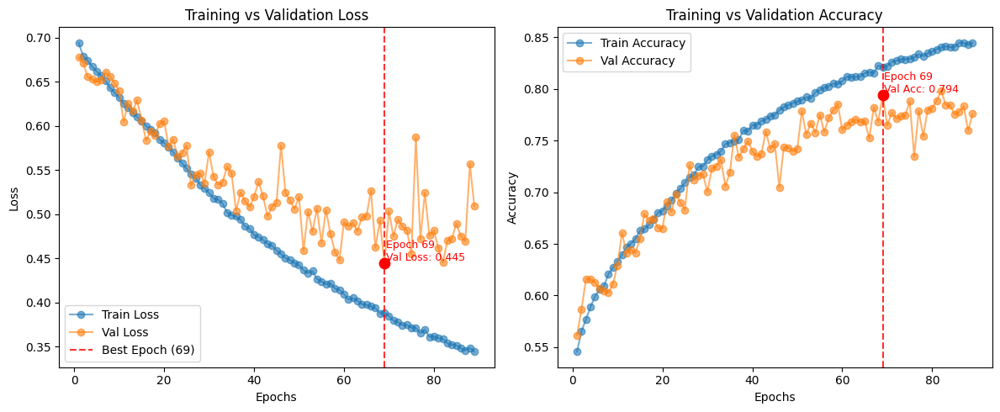

In [ ]:
plot_history_best_model(history)

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)


[RESULT] Distance-based Few-shot Accuracy: 0.0970


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)


[RESULT] Cosine similarity Few-shot Accuracy: 0.1151


In [ ]:
from evaluate import evaluate_fewshot
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.0778


#### 4.3.4 fourth attempt
* Model: CNN
* Image Size: 32 (original)
* Seen classes: 95
* Number of pairs per class: 300 positive + 300 negative
* Total pairs generated for training: 49963
* Number of epochs: 150
* Early stopping patience: 20

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 95
pos_num_pairs = 250
neg_num_pairs = 250
batch_size = 64
img_size = 32

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


100%|██████████| 169M/169M [00:15<00:00, 11.1MB/s]


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 57000
[INFO] Unseen dataset size: 3000
[INFO] Test dataset (unseen classes) size: 3000
[INFO] Total pairs generated for training: 47479
[INFO] Number of batches - Train: 668, Validation: 75
Support: torch.Size([5, 3, 32, 32]) torch.Size([5])
Query: torch.Size([2995, 3, 32, 32]) torch.Size([2995])


In [ ]:
#from models import SiameseCNN
net = SiameseCNN(embedding_dim=256).to(device)
net.summary(input_size=(64, 3, 32, 32), verbose=0)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
SiameseCNN (SiameseCNN)                  [64, 3, 32, 32]      [64, 1]              --                   True
├─CNNEncoder (encoder)                   [64, 3, 32, 32]      [64, 256]            --                   True
│    └─Sequential (conv)                 [64, 3, 32, 32]      [64, 256, 4, 4]      --                   True
│    │    └─Conv2d (0)                   [64, 3, 32, 32]      [64, 64, 32, 32]     4,864                True
│    │    └─BatchNorm2d (1)              [64, 64, 32, 32]     [64, 64, 32, 32]     128                  True
│    │    └─ReLU (2)                     [64, 64, 32, 32]     [64, 64, 32, 32]     --                   --
│    │    └─MaxPool2d (3)                [64, 64, 32, 32]     [64, 64, 16, 16]     --                   --
│    │    └─Conv2d (4)                   [64, 64, 16, 16]     [64, 128, 16, 16]    204,928              True
│    │    └─BatchN

In [ ]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 140
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen95",
    model_name="CNN",
    extra="140_epochs_300_paris_20p"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=20,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-20/cifar100_seen95/CNN/140_epochs_300_paris_20p...


Training:   0%|          | 0/140 [00:00<?, ?it/s]

Epoch [1/140] --> Train Loss: 0.6981, Train Acc: 0.5385 | Val Loss: 0.6855, Val Acc: 0.5477
  ✅ New best model saved
Epoch [2/140] --> Train Loss: 0.6818, Train Acc: 0.5602 | Val Loss: 0.6755, Val Acc: 0.5787
  ✅ New best model saved
Epoch [3/140] --> Train Loss: 0.6782, Train Acc: 0.5650 | Val Loss: 0.6696, Val Acc: 0.5896
  ✅ New best model saved
Epoch [4/140] --> Train Loss: 0.6728, Train Acc: 0.5801 | Val Loss: 0.6659, Val Acc: 0.5926
  ✅ New best model saved
Epoch [5/140] --> Train Loss: 0.6684, Train Acc: 0.5872 | Val Loss: 0.6588, Val Acc: 0.6016
  ✅ New best model saved
Epoch [6/140] --> Train Loss: 0.6654, Train Acc: 0.5921 | Val Loss: 0.6572, Val Acc: 0.6126
  ✅ New best model saved
Epoch [7/140] --> Train Loss: 0.6600, Train Acc: 0.5993 | Val Loss: 0.6530, Val Acc: 0.6219
  ✅ New best model saved
Epoch [8/140] --> Train Loss: 0.6578, Train Acc: 0.6054 | Val Loss: 0.6588, Val Acc: 0.6056
  ⚠️ No improvement. Early stop counter: 1/20
Epoch [9/140] --> Train Loss: 0.6573, Train

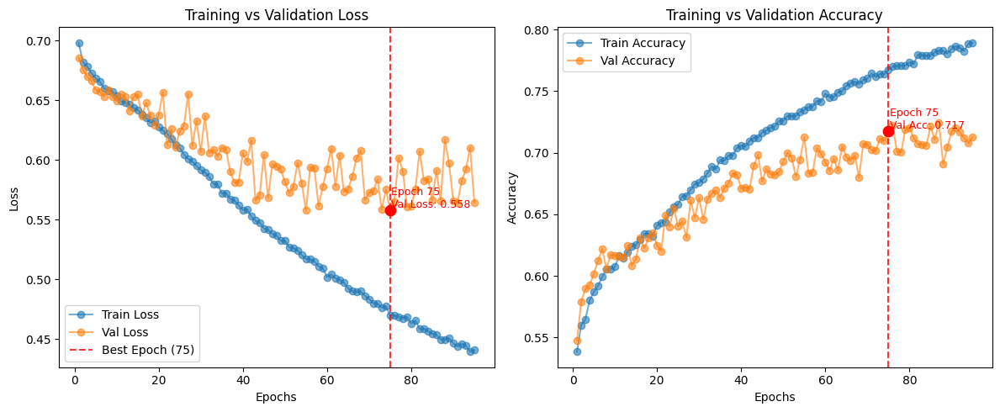

In [ ]:
plot_history_best_model(history)

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)

[RESULT] Distance-based Few-shot Accuracy: 0.5202


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)

[RESULT] Cosine similarity Few-shot Accuracy: 0.6057


In [ ]:
from evaluate import evaluate_fewshot
Acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=64)

[RESULT] Few-shot accuracy: 0.5402


### 4.4 fourth Experiment

* Model: Resnet18 + BCEWithLogits
* Image Size: 224
* Seen classes: 80
* Number of pairs per class: 350 positive + 350 negative
* Total pairs generated for training: 55970
* Number of epochs: 30
* Early stopping patience: 10

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 80
pos_num_pairs = 350
neg_num_pairs = 350
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 48000
[INFO] Unseen dataset size: 12000
[INFO] Test dataset (unseen classes) size: 12000
[INFO] Total pairs generated for training: 55970
[INFO] Number of batches - Train: 788, Validation: 88
Support: torch.Size([20, 3, 224, 224]) torch.Size([20])
Query: torch.Size([11980, 3, 224, 224]) torch.Size([11980])


In [ ]:
from models import SiameseResNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
net = SiameseResNet(embedding_size=128).to(device)
# freeze the model until layer 4
net.freeze_until(4)
net.summary(input_size=(64, 3, 224, 224), verbose=0)

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
SiameseResNet (SiameseResNet)                 [64, 3, 224, 224]    [64, 1]              513,000              Partial
├─Sequential (encoder)                        [64, 3, 224, 224]    [64, 512, 1, 1]      --                   Partial
│    └─Conv2d (0)                             [64, 3, 224, 224]    [64, 64, 112, 112]   (9,408)              False
│    └─BatchNorm2d (1)                        [64, 64, 112, 112]   [64, 64, 112, 112]   (128)                False
│    └─ReLU (2)                               [64, 64, 112, 112]   [64, 64, 112, 112]   --                   --
│    └─MaxPool2d (3)                          [64, 64, 112, 112]   [64, 64, 56, 56]     --                   --
│    └─Sequential (4)                         [64, 64, 56, 56]     [64, 64, 56, 56]     --                   False
│    │    └─BasicBlock (0)                    [64, 64, 56, 56]     [64, 64, 56

In [ ]:
from train import ContrastiveLoss, compute_pair_accuracy

In [ ]:
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = torch.nn.BCEWithLogitsLoss()

writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen80",
    model_name="siamese_resnet18",
    extra="30_epochs_350_paris_10p"
)
epochs = 30
history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=10,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p...


Training:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch [1/30] --> Train Loss: 0.6313, Train Acc: 0.6326 | Val Loss: 0.6023, Val Acc: 0.6509
  ✅ New best model saved
Epoch [2/30] --> Train Loss: 0.5826, Train Acc: 0.6886 | Val Loss: 0.5422, Val Acc: 0.7247
  ✅ New best model saved
Epoch [3/30] --> Train Loss: 0.5565, Train Acc: 0.7143 | Val Loss: 0.4982, Val Acc: 0.7595
  ✅ New best model saved
Epoch [4/30] --> Train Loss: 0.5346, Train Acc: 0.7326 | Val Loss: 0.4924, Val Acc: 0.7609
  ✅ New best model saved
Epoch [5/30] --> Train Loss: 0.5153, Train Acc: 0.7450 | Val Loss: 0.4853, Val Acc: 0.7676
  ✅ New best model saved
Epoch [6/30] --> Train Loss: 0.5018, Train Acc: 0.7579 | Val Loss: 0.4509, Val Acc: 0.7902
  ✅ New best model saved
Epoch [7/30] --> Train Loss: 0.4890, Train Acc: 0.7671 | Val Loss: 0.4355, Val Acc: 0.8003
  ✅ New best model saved
Epoch [8/30] --> Train Loss: 0.4752, Train Acc: 0.7795 | Val Loss: 0.4186, Val Acc: 0.8138
  ✅ New best model saved
Epoch [9/30] --> Train Loss: 0.4594, Train Acc: 0.7885 | Val Loss: 0.402

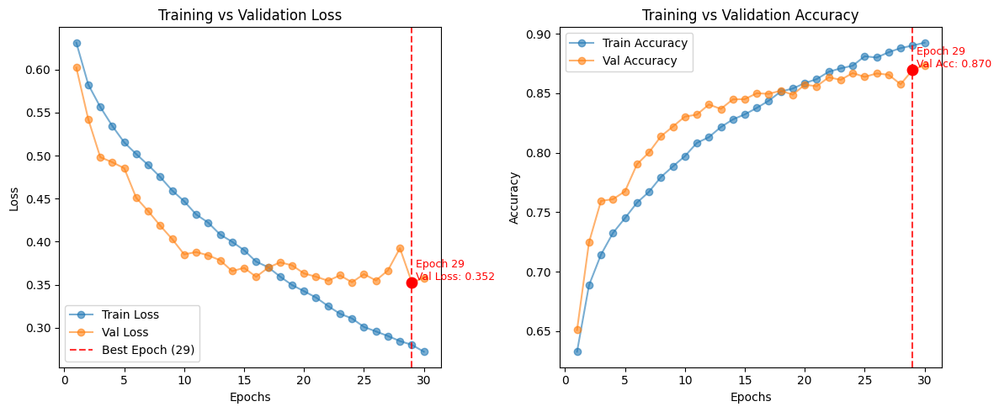

In [ ]:
plot_history(history)

In [ ]:
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.2902


In [ ]:
from train import save_model
from google.colab import files

save_model(best_model, "models", "modelResnet18_80s_30_epochs_350_paris_10p.pth")
# Download the saved model file
files.download("models/modelResnet18_80s_30_epochs_350_paris_10p.pth")

!zip -r runs.zip /content/one-short-learning/runs
files.download("runs.zip")


[INFO] Saving model to: models/modelResnet18_80s_30_epochs_350_paris_10p.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  adding: content/one-short-learning/runs/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p/Loss_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p/Loss_val/events.out.tfevents.1759654725.46729ffb7b90.3891.13 (deflated 48%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p/Accuracy_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p/Accuracy_va

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 4.5 Fifth experiment


**Contrastive Loss (1 = similar, 0 = different)**

$$
L = \frac{1}{N} \sum_{i=1}^{N} \Big[ y_i \cdot D_i^2 + (1 - y_i) \cdot \max(0, m - D_i)^2 \Big]
$$

Where:  
- \(N\) = batch size  
- \(y_i \in \{0,1\}\) = label for the pair (1 = similar, 0 = different)  
- \(D_i = \| \(f)(x_i^1) - \(f)(x_i^2) \|_2\) = Euclidean distance between embeddings  
- \(m\) = margin for dissimilar pairs  
- \(f(x)\) = embedding vector of input \(x\) produced by the network


#### 4.5.1 First attempt
* Model: Resnet18 + Contrastive Loss
* Image Size: 224
* Seen classes: 80
* Number of pairs per class: 100 positive + 100 negative
* Total pairs generated for training: 15999
* Number of epochs: 30
* Early stopping patience: 10

In [ ]:
from models import SiameseResNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#
net = SiameseResNet(embedding_size=128).to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 209MB/s]


In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 80
pos_num_pairs = 100
neg_num_pairs = 100
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 48000
[INFO] Unseen dataset size: 12000
[INFO] Test dataset (unseen classes) size: 12000
[INFO] Total pairs generated for training: 15998
[INFO] Number of batches - Train: 225, Validation: 25


In [ ]:
net = SiameseResNet(embedding_size=128).to(device)
# freeze the model until layer 4
net.freeze_until(4)
#net.summary(input_size=(64, 3, 224, 224), verbose=0)

In [ ]:
import torch
import torch.nn.functional as F
from tqdm import tqdm

# -------------------------------
# Training Step
# -------------------------------
def train_step_contrastive(model, dataloader, loss_fn, optimizer, device, threshold=1.0):
    model.train()
    total_loss, total_acc, total_samples = 0.0, 0.0, 0

    for img1, img2, labels in dataloader:
        img1, img2, labels = img1.to(device), img2.to(device), labels.to(device).float()

        optimizer.zero_grad()

        # Forward pass
        output1 = model.forward_once(img1)
        output2 = model.forward_once(img2)

        # Compute loss
        loss = loss_fn(output1, output2, labels)

        # Backward + update
        loss.backward()
        optimizer.step()

        # Compute pair accuracy
        acc = compute_pair_accuracy(output1, output2, labels, threshold=threshold)

        # Accumulate
        batch_size = labels.size(0)
        total_loss += loss.item() * batch_size
        total_acc += acc * batch_size
        total_samples += batch_size

    return total_loss / total_samples, total_acc / total_samples


# -------------------------------
# Validation Step
# -------------------------------
def val_step_contrastive(model, dataloader, loss_fn, device, threshold=1.0):
    model.eval()
    total_loss, total_acc, total_samples = 0.0, 0.0, 0

    with torch.no_grad():
        for img1, img2, labels in dataloader:
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device).float()

            output1 = model.forward_once(img1)
            output2 = model.forward_once(img2)

            loss = loss_fn(output1, output2, labels)
            acc = compute_pair_accuracy(output1, output2, labels, threshold=threshold)

            batch_size = labels.size(0)
            total_loss += loss.item() * batch_size
            total_acc += acc * batch_size
            total_samples += batch_size

    return total_loss / total_samples, total_acc / total_samples


# -------------------------------
# Full Training Loop
# -------------------------------
def train_contrastive(model, train_loader, valid_loader, optimizer, loss_fn, device,
                      epochs=50, patience=10, threshold=1.0, writer=None):
    best_val_loss = float("inf")
    best_model_wts = model.state_dict()
    early_stop_counter = 0

    history = {"train_loss": [], "train_acc": [],
               "val_loss": [], "val_acc": []}

    for epoch in tqdm(range(epochs), desc="Training (Contrastive)", leave=True):
        train_loss, train_acc = train_step_contrastive(model, train_loader, loss_fn, optimizer, device, threshold)
        val_loss, val_acc = val_step_contrastive(model, valid_loader, loss_fn, device, threshold)

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        print(f"Epoch [{epoch+1}/{epochs}] --> "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        # TensorBoard logging
        if writer is not None:
            writer.add_scalars("Loss", {"train": train_loss, "val": val_loss}, global_step=epoch)
            writer.add_scalars("Accuracy", {"train": train_acc, "val": val_acc}, global_step=epoch)

        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = model.state_dict()
            early_stop_counter = 0
            print("  ✅ New best model saved")
        else:
            early_stop_counter += 1
            print(f"  ⚠️ No improvement. Early stop counter: {early_stop_counter}/{patience}")
            if early_stop_counter >= patience:
                print("⏹️ Early stopping triggered!")
                break

    model.load_state_dict(best_model_wts)
    if writer is not None:
        writer.close()

    return history, model


In [ ]:
%%time
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = ContrastiveLoss()


epochs = 30
history, best_model = train_contrastive(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=10,
    writer=None
)

Training (Contrastive):   3%|▎         | 1/30 [03:30<1:41:55, 210.90s/it]

Epoch [1/30] --> Train Loss: 0.6718, Train Acc: 0.5249 | Val Loss: 0.5170, Val Acc: 0.6104
  ✅ New best model saved


Training (Contrastive):   7%|▋         | 2/30 [07:01<1:38:26, 210.96s/it]

Epoch [2/30] --> Train Loss: 0.5833, Train Acc: 0.5422 | Val Loss: 0.6050, Val Acc: 0.5178
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  10%|█         | 3/30 [10:32<1:34:45, 210.58s/it]

Epoch [3/30] --> Train Loss: 0.5602, Train Acc: 0.5598 | Val Loss: 0.5435, Val Acc: 0.5810
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  13%|█▎        | 4/30 [14:02<1:31:15, 210.58s/it]

Epoch [4/30] --> Train Loss: 0.5734, Train Acc: 0.5447 | Val Loss: 0.5928, Val Acc: 0.5485
  ⚠️ No improvement. Early stop counter: 3/10


Training (Contrastive):  17%|█▋        | 5/30 [17:32<1:27:40, 210.43s/it]

Epoch [5/30] --> Train Loss: 0.5644, Train Acc: 0.5576 | Val Loss: 0.5393, Val Acc: 0.5660
  ⚠️ No improvement. Early stop counter: 4/10


Training (Contrastive):  20%|██        | 6/30 [21:02<1:24:06, 210.27s/it]

Epoch [6/30] --> Train Loss: 0.5699, Train Acc: 0.5424 | Val Loss: 0.5073, Val Acc: 0.6141
  ✅ New best model saved


Training (Contrastive):  23%|██▎       | 7/30 [24:32<1:20:35, 210.25s/it]

Epoch [7/30] --> Train Loss: 0.5648, Train Acc: 0.5518 | Val Loss: 0.5959, Val Acc: 0.5372
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  27%|██▋       | 8/30 [28:03<1:17:06, 210.28s/it]

Epoch [8/30] --> Train Loss: 0.5562, Train Acc: 0.5558 | Val Loss: 0.5124, Val Acc: 0.6060
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  30%|███       | 9/30 [31:33<1:13:35, 210.26s/it]

Epoch [9/30] --> Train Loss: 0.5462, Train Acc: 0.5735 | Val Loss: 0.4933, Val Acc: 0.6054
  ✅ New best model saved


Training (Contrastive):  33%|███▎      | 10/30 [35:03<1:10:03, 210.18s/it]

Epoch [10/30] --> Train Loss: 0.5500, Train Acc: 0.5683 | Val Loss: 0.5411, Val Acc: 0.5772
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  37%|███▋      | 11/30 [38:33<1:06:32, 210.15s/it]

Epoch [11/30] --> Train Loss: 0.5468, Train Acc: 0.5723 | Val Loss: 0.5312, Val Acc: 0.5679
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  40%|████      | 12/30 [42:03<1:03:02, 210.11s/it]

Epoch [12/30] --> Train Loss: 0.5259, Train Acc: 0.5758 | Val Loss: 0.4922, Val Acc: 0.6023
  ✅ New best model saved


Training (Contrastive):  43%|████▎     | 13/30 [45:33<59:31, 210.08s/it]  

Epoch [13/30] --> Train Loss: 0.4981, Train Acc: 0.5992 | Val Loss: 0.4564, Val Acc: 0.6423
  ✅ New best model saved


Training (Contrastive):  47%|████▋     | 14/30 [49:04<56:03, 210.23s/it]

Epoch [14/30] --> Train Loss: 0.4857, Train Acc: 0.5963 | Val Loss: 0.5086, Val Acc: 0.5691
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  50%|█████     | 15/30 [52:35<52:38, 210.55s/it]

Epoch [15/30] --> Train Loss: 0.4743, Train Acc: 0.6103 | Val Loss: 0.4792, Val Acc: 0.6154
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  53%|█████▎    | 16/30 [56:06<49:09, 210.67s/it]

Epoch [16/30] --> Train Loss: 0.4665, Train Acc: 0.6144 | Val Loss: 0.4883, Val Acc: 0.5941
  ⚠️ No improvement. Early stop counter: 3/10


Training (Contrastive):  57%|█████▋    | 17/30 [59:36<45:37, 210.56s/it]

Epoch [17/30] --> Train Loss: 0.4612, Train Acc: 0.6182 | Val Loss: 0.4595, Val Acc: 0.6360
  ⚠️ No improvement. Early stop counter: 4/10


Training (Contrastive):  60%|██████    | 18/30 [1:03:07<42:08, 210.73s/it]

Epoch [18/30] --> Train Loss: 0.4480, Train Acc: 0.6328 | Val Loss: 0.4211, Val Acc: 0.6917
  ✅ New best model saved


Training (Contrastive):  63%|██████▎   | 19/30 [1:06:38<38:36, 210.55s/it]

Epoch [19/30] --> Train Loss: 0.4425, Train Acc: 0.6397 | Val Loss: 0.4418, Val Acc: 0.6654
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  67%|██████▋   | 20/30 [1:10:07<35:03, 210.38s/it]

Epoch [20/30] --> Train Loss: 0.4397, Train Acc: 0.6409 | Val Loss: 0.4607, Val Acc: 0.6266
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  70%|███████   | 21/30 [1:13:38<31:32, 210.33s/it]

Epoch [21/30] --> Train Loss: 0.4305, Train Acc: 0.6552 | Val Loss: 0.4744, Val Acc: 0.6173
  ⚠️ No improvement. Early stop counter: 3/10


Training (Contrastive):  73%|███████▎  | 22/30 [1:17:08<28:01, 210.20s/it]

Epoch [22/30] --> Train Loss: 0.4299, Train Acc: 0.6531 | Val Loss: 0.4378, Val Acc: 0.6667
  ⚠️ No improvement. Early stop counter: 4/10


Training (Contrastive):  77%|███████▋  | 23/30 [1:20:38<24:31, 210.25s/it]

Epoch [23/30] --> Train Loss: 0.4328, Train Acc: 0.6459 | Val Loss: 0.4300, Val Acc: 0.6717
  ⚠️ No improvement. Early stop counter: 5/10


Training (Contrastive):  80%|████████  | 24/30 [1:24:09<21:02, 210.42s/it]

Epoch [24/30] --> Train Loss: 0.4259, Train Acc: 0.6585 | Val Loss: 0.4115, Val Acc: 0.6954
  ✅ New best model saved


Training (Contrastive):  83%|████████▎ | 25/30 [1:27:39<17:32, 210.48s/it]

Epoch [25/30] --> Train Loss: 0.4528, Train Acc: 0.6529 | Val Loss: 0.4557, Val Acc: 0.6473
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  87%|████████▋ | 26/30 [1:31:09<14:01, 210.36s/it]

Epoch [26/30] --> Train Loss: 0.4240, Train Acc: 0.6597 | Val Loss: 0.4580, Val Acc: 0.6448
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  90%|█████████ | 27/30 [1:34:40<10:31, 210.36s/it]

Epoch [27/30] --> Train Loss: 0.4188, Train Acc: 0.6706 | Val Loss: 0.4402, Val Acc: 0.6623
  ⚠️ No improvement. Early stop counter: 3/10


Training (Contrastive):  93%|█████████▎| 28/30 [1:38:10<07:00, 210.38s/it]

Epoch [28/30] --> Train Loss: 0.4092, Train Acc: 0.6764 | Val Loss: 0.4708, Val Acc: 0.6279
  ⚠️ No improvement. Early stop counter: 4/10


Training (Contrastive):  97%|█████████▋| 29/30 [1:41:41<03:30, 210.49s/it]

Epoch [29/30] --> Train Loss: 0.4323, Train Acc: 0.6544 | Val Loss: 0.4829, Val Acc: 0.6216
  ⚠️ No improvement. Early stop counter: 5/10


Training (Contrastive): 100%|██████████| 30/30 [1:45:11<00:00, 210.40s/it]

Epoch [30/30] --> Train Loss: 0.4095, Train Acc: 0.6781 | Val Loss: 0.4339, Val Acc: 0.6692
  ⚠️ No improvement. Early stop counter: 6/10


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
net = torch.load("/content/contrastive.pth", map_location=device)

In [ ]:
import torch
import torch.nn.functional as F
import torch

def evaluate_fewshot_contrastive(model, support_loader, query_loader, device="cuda", threshold=1.0, batch_size=512):
    """
    Evaluate a Siamese network trained with contrastive loss on a 1-shot N-way task.

    Args:
        model: SiameseResNet (outputs embeddings)
        support_loader: DataLoader with support set (1 per class)
        query_loader: DataLoader with query images
        device: "cuda" or "cpu"
        threshold: distance threshold for similarity (optional)
        batch_size: chunk size for processing query-support pairs

    Returns:
        few-shot accuracy (float)
    """
    model.eval()
    total_correct, total_samples = 0, 0

    # Load support set (assume tiny, take all at once)
    support_images, support_labels = next(iter(support_loader))
    support_images, support_labels = support_images.to(device), support_labels.to(device)
    K = support_images.size(0)  # number of classes

    with torch.no_grad():
        # Precompute embeddings for support images
        support_embeddings = model.forward_once(support_images)

        for query_images, query_labels in query_loader:
            query_images, query_labels = query_images.to(device), query_labels.to(device)
            Q = query_images.size(0)

            # Compute embeddings for query batch
            query_embeddings = model.forward_once(query_images)  # [Q, embedding_dim]

            # Expand for pairwise distance computation
            q_exp = query_embeddings.unsqueeze(1).expand(-1, K, -1)   # [Q, K, D]
            s_exp = support_embeddings.unsqueeze(0).expand(Q, -1, -1) # [Q, K, D]

            # Euclidean distance between each query and each support
            distances = torch.norm(q_exp - s_exp, dim=2)  # [Q, K]

            # Choose the support with minimum distance
            best_idx = torch.argmin(distances, dim=1)  # [Q]
            pred_labels = support_labels[best_idx]

            # Compute accuracy
            total_correct += (pred_labels == query_labels).sum().item()
            total_samples += query_labels.size(0)

    acc = total_correct / total_samples
    print(f"[RESULT] Few-shot accuracy (contrastive embeddings): {acc:.4f}")
    return acc

acc = evaluate_fewshot_contrastive(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy (contrastive embeddings): 0.3132


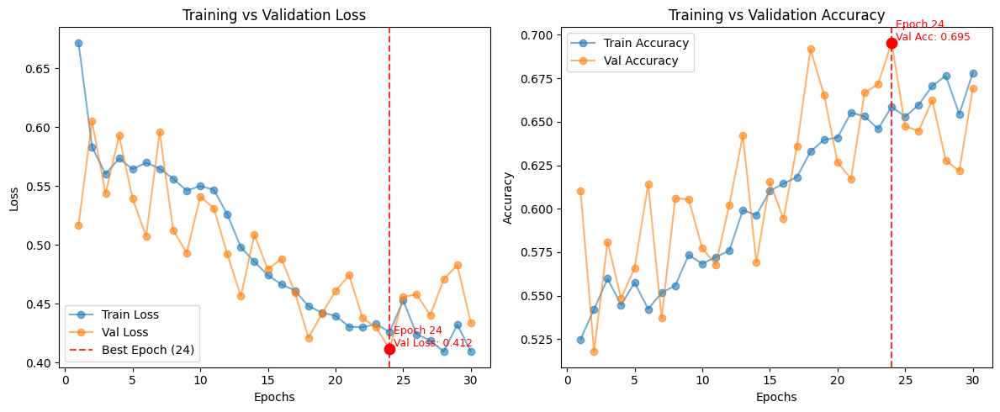

In [ ]:

plot_history(history)


#### 4.5.2 Second ateempt
* Model: CNN + Contrastive Loss
* Image Size: 32
* Seen classes: 90
* Number of pairs per class: 300 positive + 300 negative
* Total pairs generated for training: 53973
* Number of epochs: 120
* Early stopping patience: 15

In [ ]:
import torch
import torch.nn as nn

# -------------------------------
# CNN Encoder for 32x32 images
# -------------------------------
class CNNEncoder(nn.Module):
    def __init__(self, embedding_dim=128):
        super().__init__()
        self.conv = nn.Sequential(
            # Input: 3x32x32
            nn.Conv2d(3, 64, kernel_size=5, stride=1, padding=2),  # -> 64x32x32
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),  # -> 64x16x16

            nn.Conv2d(64, 128, kernel_size=5, stride=1, padding=2), # -> 128x16x16
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),  # -> 128x8x8

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1), # -> 256x8x8
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2)  # -> 256x4x4
        )

        self.fc = nn.Sequential(
            nn.Linear(256*4*4, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, embedding_dim)  # -> final embedding
        )


    def forward(self, x):
        x = self.conv(x)
        x = x.view(x.size(0), -1)  # flatten
        x = self.fc(x)
        return x


# -------------------------------
# Siamese Network
# -------------------------------
class SiameseCNN(nn.Module):
    def __init__(self, embedding_dim=128):
        super().__init__()
        self.encoder = CNNEncoder(embedding_dim)
        self.classifier = nn.Linear(embedding_dim, 1)  # single logit for BCE

    def forward_once(self, x):
        return self.encoder(x)

    def forward(self, x1, x2):
        e1 = self.forward_once(x1)
        e2 = self.forward_once(x2)

        diff = torch.abs(e1 - e2)
        out = self.classifier(diff)  # logits for BCEWithLogitsLoss
        return out
net = SiameseCNN(embedding_dim=128).to(device)
summary(net,
              [(1, 3, 32, 32), (1, 3, 32, 32)],  # two inputs
        verbose=0,
                col_names=["input_size", "output_size", "num_params", "trainable"],
                col_width=20,
                row_settings=["var_names"])


Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
SiameseCNN (SiameseCNN)                  [1, 3, 32, 32]       [1, 1]               --                   True
├─CNNEncoder (encoder)                   [1, 3, 32, 32]       [1, 128]             --                   True
│    └─Sequential (conv)                 [1, 3, 32, 32]       [1, 256, 4, 4]       --                   True
│    │    └─Conv2d (0)                   [1, 3, 32, 32]       [1, 64, 32, 32]      4,864                True
│    │    └─BatchNorm2d (1)              [1, 64, 32, 32]      [1, 64, 32, 32]      128                  True
│    │    └─ReLU (2)                     [1, 64, 32, 32]      [1, 64, 32, 32]      --                   --
│    │    └─MaxPool2d (3)                [1, 64, 32, 32]      [1, 64, 16, 16]      --                   --
│    │    └─Conv2d (4)                   [1, 64, 16, 16]      [1, 128, 16, 16]     204,928              True
│    │    └─BatchN

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 90
pos_num_pairs = 300
neg_num_pairs = 300
batch_size = 64
img_size = 32

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 54000
[INFO] Unseen dataset size: 6000
[INFO] Test dataset (unseen classes) size: 6000
[INFO] Total pairs generated for training: 53973
[INFO] Number of batches - Train: 759, Validation: 85
Support: torch.Size([10, 3, 32, 32]) torch.Size([10])
Query: torch.Size([5990, 3, 32, 32]) torch.Size([5990])


In [ ]:
from train import ContrastiveLoss, compute_pair_accuracy
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = ContrastiveLoss()


epochs = 120
history, best_model = train_contrastive(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=15,
    writer=None
)

Training (Contrastive):   1%|          | 1/120 [02:00<3:59:37, 120.82s/it]

Epoch [1/120] --> Train Loss: 0.5575, Train Acc: 0.5257 | Val Loss: 0.6315, Val Acc: 0.5042
  ✅ New best model saved


Training (Contrastive):   2%|▏         | 2/120 [04:00<3:55:47, 119.89s/it]

Epoch [2/120] --> Train Loss: 0.5318, Train Acc: 0.5390 | Val Loss: 0.5253, Val Acc: 0.5560
  ✅ New best model saved


Training (Contrastive):   2%|▎         | 3/120 [05:58<3:52:48, 119.39s/it]

Epoch [3/120] --> Train Loss: 0.5308, Train Acc: 0.5356 | Val Loss: 0.5628, Val Acc: 0.5381
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):   3%|▎         | 4/120 [07:57<3:50:03, 118.99s/it]

Epoch [4/120] --> Train Loss: 0.5298, Train Acc: 0.5371 | Val Loss: 0.5542, Val Acc: 0.5271
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):   4%|▍         | 5/120 [09:55<3:47:42, 118.81s/it]

Epoch [5/120] --> Train Loss: 0.5244, Train Acc: 0.5431 | Val Loss: 0.5933, Val Acc: 0.5068
  ⚠️ No improvement. Early stop counter: 3/15


Training (Contrastive):   5%|▌         | 6/120 [11:54<3:45:31, 118.69s/it]

Epoch [6/120] --> Train Loss: 0.5253, Train Acc: 0.5408 | Val Loss: 0.5497, Val Acc: 0.5327
  ⚠️ No improvement. Early stop counter: 4/15


Training (Contrastive):   6%|▌         | 7/120 [13:52<3:43:34, 118.71s/it]

Epoch [7/120] --> Train Loss: 0.5173, Train Acc: 0.5491 | Val Loss: 0.5224, Val Acc: 0.5592
  ✅ New best model saved


Training (Contrastive):   7%|▋         | 8/120 [15:52<3:42:09, 119.01s/it]

Epoch [8/120] --> Train Loss: 0.5116, Train Acc: 0.5487 | Val Loss: 0.5601, Val Acc: 0.5240
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):   8%|▊         | 9/120 [17:52<3:40:27, 119.16s/it]

Epoch [9/120] --> Train Loss: 0.5059, Train Acc: 0.5545 | Val Loss: 0.5319, Val Acc: 0.5360
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):   8%|▊         | 10/120 [19:50<3:38:18, 119.08s/it]

Epoch [10/120] --> Train Loss: 0.5004, Train Acc: 0.5593 | Val Loss: 0.5202, Val Acc: 0.5479
  ✅ New best model saved


Training (Contrastive):   9%|▉         | 11/120 [21:50<3:36:38, 119.25s/it]

Epoch [11/120] --> Train Loss: 0.4964, Train Acc: 0.5625 | Val Loss: 0.5001, Val Acc: 0.5840
  ✅ New best model saved


Training (Contrastive):  10%|█         | 12/120 [23:51<3:35:17, 119.61s/it]

Epoch [12/120] --> Train Loss: 0.4936, Train Acc: 0.5688 | Val Loss: 0.5316, Val Acc: 0.5492
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  11%|█         | 13/120 [25:50<3:33:04, 119.48s/it]

Epoch [13/120] --> Train Loss: 0.4875, Train Acc: 0.5780 | Val Loss: 0.4989, Val Acc: 0.5853
  ✅ New best model saved


Training (Contrastive):  12%|█▏        | 14/120 [27:49<3:30:53, 119.37s/it]

Epoch [14/120] --> Train Loss: 0.4846, Train Acc: 0.5841 | Val Loss: 0.4843, Val Acc: 0.5976
  ✅ New best model saved


Training (Contrastive):  12%|█▎        | 15/120 [29:49<3:29:22, 119.64s/it]

Epoch [15/120] --> Train Loss: 0.4796, Train Acc: 0.5880 | Val Loss: 0.4797, Val Acc: 0.6063
  ✅ New best model saved


Training (Contrastive):  13%|█▎        | 16/120 [31:48<3:27:07, 119.50s/it]

Epoch [16/120] --> Train Loss: 0.4751, Train Acc: 0.5950 | Val Loss: 0.4613, Val Acc: 0.6218
  ✅ New best model saved


Training (Contrastive):  14%|█▍        | 17/120 [33:47<3:24:46, 119.29s/it]

Epoch [17/120] --> Train Loss: 0.4704, Train Acc: 0.6023 | Val Loss: 0.4627, Val Acc: 0.6185
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  15%|█▌        | 18/120 [35:46<3:22:23, 119.05s/it]

Epoch [18/120] --> Train Loss: 0.4649, Train Acc: 0.6090 | Val Loss: 0.4656, Val Acc: 0.6077
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  16%|█▌        | 19/120 [37:50<3:23:03, 120.63s/it]

Epoch [19/120] --> Train Loss: 0.4623, Train Acc: 0.6133 | Val Loss: 0.4641, Val Acc: 0.6148
  ⚠️ No improvement. Early stop counter: 3/15


Training (Contrastive):  17%|█▋        | 20/120 [39:51<3:21:05, 120.65s/it]

Epoch [20/120] --> Train Loss: 0.4573, Train Acc: 0.6206 | Val Loss: 0.4527, Val Acc: 0.6203
  ✅ New best model saved


Training (Contrastive):  18%|█▊        | 21/120 [41:50<3:18:18, 120.19s/it]

Epoch [21/120] --> Train Loss: 0.4553, Train Acc: 0.6222 | Val Loss: 0.4461, Val Acc: 0.6322
  ✅ New best model saved


Training (Contrastive):  18%|█▊        | 22/120 [43:50<3:16:10, 120.10s/it]

Epoch [22/120] --> Train Loss: 0.4535, Train Acc: 0.6250 | Val Loss: 0.4406, Val Acc: 0.6429
  ✅ New best model saved


Training (Contrastive):  19%|█▉        | 23/120 [45:50<3:14:06, 120.07s/it]

Epoch [23/120] --> Train Loss: 0.4504, Train Acc: 0.6288 | Val Loss: 0.4491, Val Acc: 0.6289
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  20%|██        | 24/120 [47:49<3:11:53, 119.94s/it]

Epoch [24/120] --> Train Loss: 0.4481, Train Acc: 0.6301 | Val Loss: 0.4379, Val Acc: 0.6385
  ✅ New best model saved


Training (Contrastive):  21%|██        | 25/120 [49:50<3:10:13, 120.14s/it]

Epoch [25/120] --> Train Loss: 0.4475, Train Acc: 0.6317 | Val Loss: 0.4312, Val Acc: 0.6491
  ✅ New best model saved


Training (Contrastive):  22%|██▏       | 26/120 [51:51<3:08:39, 120.42s/it]

Epoch [26/120] --> Train Loss: 0.4445, Train Acc: 0.6344 | Val Loss: 0.4336, Val Acc: 0.6461
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  22%|██▎       | 27/120 [53:52<3:07:01, 120.66s/it]

Epoch [27/120] --> Train Loss: 0.4434, Train Acc: 0.6397 | Val Loss: 0.4389, Val Acc: 0.6446
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  23%|██▎       | 28/120 [55:52<3:04:40, 120.44s/it]

Epoch [28/120] --> Train Loss: 0.4407, Train Acc: 0.6407 | Val Loss: 0.4206, Val Acc: 0.6589
  ✅ New best model saved


Training (Contrastive):  24%|██▍       | 29/120 [57:51<3:02:09, 120.10s/it]

Epoch [29/120] --> Train Loss: 0.4366, Train Acc: 0.6483 | Val Loss: 0.4291, Val Acc: 0.6543
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  25%|██▌       | 30/120 [59:51<2:59:59, 120.00s/it]

Epoch [30/120] --> Train Loss: 0.4353, Train Acc: 0.6459 | Val Loss: 0.4265, Val Acc: 0.6581
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  26%|██▌       | 31/120 [1:01:50<2:57:37, 119.74s/it]

Epoch [31/120] --> Train Loss: 0.4355, Train Acc: 0.6474 | Val Loss: 0.4240, Val Acc: 0.6607
  ⚠️ No improvement. Early stop counter: 3/15


Training (Contrastive):  27%|██▋       | 32/120 [1:03:49<2:55:14, 119.49s/it]

Epoch [32/120] --> Train Loss: 0.4308, Train Acc: 0.6565 | Val Loss: 0.4237, Val Acc: 0.6555
  ⚠️ No improvement. Early stop counter: 4/15


Training (Contrastive):  28%|██▊       | 33/120 [1:05:48<2:52:51, 119.21s/it]

Epoch [33/120] --> Train Loss: 0.4305, Train Acc: 0.6550 | Val Loss: 0.4187, Val Acc: 0.6694
  ✅ New best model saved


Training (Contrastive):  28%|██▊       | 34/120 [1:07:46<2:50:22, 118.87s/it]

Epoch [34/120] --> Train Loss: 0.4272, Train Acc: 0.6599 | Val Loss: 0.4175, Val Acc: 0.6628
  ✅ New best model saved


Training (Contrastive):  29%|██▉       | 35/120 [1:09:45<2:48:21, 118.84s/it]

Epoch [35/120] --> Train Loss: 0.4254, Train Acc: 0.6612 | Val Loss: 0.4134, Val Acc: 0.6674
  ✅ New best model saved


Training (Contrastive):  30%|███       | 36/120 [1:11:43<2:46:19, 118.80s/it]

Epoch [36/120] --> Train Loss: 0.4247, Train Acc: 0.6612 | Val Loss: 0.4127, Val Acc: 0.6689
  ✅ New best model saved


Training (Contrastive):  31%|███       | 37/120 [1:13:42<2:44:08, 118.66s/it]

Epoch [37/120] --> Train Loss: 0.4225, Train Acc: 0.6636 | Val Loss: 0.4135, Val Acc: 0.6696
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  32%|███▏      | 38/120 [1:15:40<2:42:10, 118.66s/it]

Epoch [38/120] --> Train Loss: 0.4226, Train Acc: 0.6642 | Val Loss: 0.4189, Val Acc: 0.6591
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  32%|███▎      | 39/120 [1:17:39<2:40:17, 118.74s/it]

Epoch [39/120] --> Train Loss: 0.4190, Train Acc: 0.6666 | Val Loss: 0.4090, Val Acc: 0.6744
  ✅ New best model saved


Training (Contrastive):  33%|███▎      | 40/120 [1:19:38<2:38:13, 118.67s/it]

Epoch [40/120] --> Train Loss: 0.4196, Train Acc: 0.6682 | Val Loss: 0.4093, Val Acc: 0.6733
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  34%|███▍      | 41/120 [1:21:36<2:36:13, 118.65s/it]

Epoch [41/120] --> Train Loss: 0.4154, Train Acc: 0.6740 | Val Loss: 0.4098, Val Acc: 0.6843
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  35%|███▌      | 42/120 [1:23:36<2:34:38, 118.95s/it]

Epoch [42/120] --> Train Loss: 0.4142, Train Acc: 0.6745 | Val Loss: 0.4151, Val Acc: 0.6704
  ⚠️ No improvement. Early stop counter: 3/15


Training (Contrastive):  36%|███▌      | 43/120 [1:25:36<2:32:57, 119.18s/it]

Epoch [43/120] --> Train Loss: 0.4115, Train Acc: 0.6763 | Val Loss: 0.4087, Val Acc: 0.6759
  ✅ New best model saved


Training (Contrastive):  37%|███▋      | 44/120 [1:27:35<2:31:06, 119.30s/it]

Epoch [44/120] --> Train Loss: 0.4114, Train Acc: 0.6783 | Val Loss: 0.4031, Val Acc: 0.6843
  ✅ New best model saved


Training (Contrastive):  38%|███▊      | 45/120 [1:29:35<2:29:14, 119.40s/it]

Epoch [45/120] --> Train Loss: 0.4080, Train Acc: 0.6812 | Val Loss: 0.3952, Val Acc: 0.6869
  ✅ New best model saved


Training (Contrastive):  38%|███▊      | 46/120 [1:31:36<2:27:59, 119.99s/it]

Epoch [46/120] --> Train Loss: 0.4074, Train Acc: 0.6834 | Val Loss: 0.4029, Val Acc: 0.6791
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  39%|███▉      | 47/120 [1:33:37<2:26:15, 120.22s/it]

Epoch [47/120] --> Train Loss: 0.4051, Train Acc: 0.6848 | Val Loss: 0.3969, Val Acc: 0.6859
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  40%|████      | 48/120 [1:35:38<2:24:34, 120.47s/it]

Epoch [48/120] --> Train Loss: 0.4042, Train Acc: 0.6870 | Val Loss: 0.3933, Val Acc: 0.6891
  ✅ New best model saved


Training (Contrastive):  41%|████      | 49/120 [1:37:39<2:22:49, 120.70s/it]

Epoch [49/120] --> Train Loss: 0.4033, Train Acc: 0.6868 | Val Loss: 0.3951, Val Acc: 0.6950
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  42%|████▏     | 50/120 [1:39:39<2:20:26, 120.37s/it]

Epoch [50/120] --> Train Loss: 0.4013, Train Acc: 0.6901 | Val Loss: 0.3956, Val Acc: 0.6958
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  42%|████▎     | 51/120 [1:41:39<2:18:16, 120.24s/it]

Epoch [51/120] --> Train Loss: 0.3987, Train Acc: 0.6948 | Val Loss: 0.3928, Val Acc: 0.6924
  ✅ New best model saved


Training (Contrastive):  43%|████▎     | 52/120 [1:43:39<2:16:22, 120.33s/it]

Epoch [52/120] --> Train Loss: 0.3999, Train Acc: 0.6913 | Val Loss: 0.3912, Val Acc: 0.7078
  ✅ New best model saved


Training (Contrastive):  44%|████▍     | 53/120 [1:45:39<2:14:03, 120.06s/it]

Epoch [53/120] --> Train Loss: 0.3986, Train Acc: 0.6928 | Val Loss: 0.3865, Val Acc: 0.7026
  ✅ New best model saved


Training (Contrastive):  45%|████▌     | 54/120 [1:47:39<2:12:01, 120.02s/it]

Epoch [54/120] --> Train Loss: 0.3963, Train Acc: 0.6944 | Val Loss: 0.3896, Val Acc: 0.6946
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  46%|████▌     | 55/120 [1:49:38<2:09:55, 119.93s/it]

Epoch [55/120] --> Train Loss: 0.3960, Train Acc: 0.6961 | Val Loss: 0.3899, Val Acc: 0.6932
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  47%|████▋     | 56/120 [1:51:39<2:08:11, 120.18s/it]

Epoch [56/120] --> Train Loss: 0.3941, Train Acc: 0.6988 | Val Loss: 0.3883, Val Acc: 0.6937
  ⚠️ No improvement. Early stop counter: 3/15


Training (Contrastive):  48%|████▊     | 57/120 [1:53:39<2:06:07, 120.11s/it]

Epoch [57/120] --> Train Loss: 0.3913, Train Acc: 0.7017 | Val Loss: 0.3852, Val Acc: 0.7028
  ✅ New best model saved


Training (Contrastive):  48%|████▊     | 58/120 [1:55:39<2:03:57, 119.96s/it]

Epoch [58/120] --> Train Loss: 0.3895, Train Acc: 0.7030 | Val Loss: 0.3812, Val Acc: 0.7078
  ✅ New best model saved


Training (Contrastive):  49%|████▉     | 59/120 [1:57:38<2:01:45, 119.76s/it]

Epoch [59/120] --> Train Loss: 0.3891, Train Acc: 0.7043 | Val Loss: 0.3784, Val Acc: 0.7141
  ✅ New best model saved


Training (Contrastive):  50%|█████     | 60/120 [1:59:36<1:59:18, 119.32s/it]

Epoch [60/120] --> Train Loss: 0.3894, Train Acc: 0.7016 | Val Loss: 0.3799, Val Acc: 0.7095
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  51%|█████     | 61/120 [2:01:34<1:56:47, 118.78s/it]

Epoch [61/120] --> Train Loss: 0.3871, Train Acc: 0.7055 | Val Loss: 0.3814, Val Acc: 0.7080
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  52%|█████▏    | 62/120 [2:03:32<1:54:42, 118.66s/it]

Epoch [62/120] --> Train Loss: 0.3855, Train Acc: 0.7088 | Val Loss: 0.3785, Val Acc: 0.7167
  ⚠️ No improvement. Early stop counter: 3/15


Training (Contrastive):  52%|█████▎    | 63/120 [2:05:31<1:52:48, 118.74s/it]

Epoch [63/120] --> Train Loss: 0.3848, Train Acc: 0.7077 | Val Loss: 0.3775, Val Acc: 0.7130
  ✅ New best model saved


Training (Contrastive):  53%|█████▎    | 64/120 [2:07:33<1:51:37, 119.60s/it]

Epoch [64/120] --> Train Loss: 0.3833, Train Acc: 0.7090 | Val Loss: 0.3791, Val Acc: 0.7145
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  54%|█████▍    | 65/120 [2:09:34<1:49:56, 119.94s/it]

Epoch [65/120] --> Train Loss: 0.3843, Train Acc: 0.7089 | Val Loss: 0.3762, Val Acc: 0.7115
  ✅ New best model saved


Training (Contrastive):  55%|█████▌    | 66/120 [2:11:34<1:48:07, 120.13s/it]

Epoch [66/120] --> Train Loss: 0.3831, Train Acc: 0.7109 | Val Loss: 0.3732, Val Acc: 0.7187
  ✅ New best model saved


Training (Contrastive):  56%|█████▌    | 67/120 [2:13:35<1:46:15, 120.30s/it]

Epoch [67/120] --> Train Loss: 0.3814, Train Acc: 0.7141 | Val Loss: 0.3760, Val Acc: 0.7134
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  57%|█████▋    | 68/120 [2:15:35<1:44:09, 120.18s/it]

Epoch [68/120] --> Train Loss: 0.3791, Train Acc: 0.7155 | Val Loss: 0.3817, Val Acc: 0.7095
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  57%|█████▊    | 69/120 [2:17:36<1:42:27, 120.54s/it]

Epoch [69/120] --> Train Loss: 0.3790, Train Acc: 0.7157 | Val Loss: 0.3739, Val Acc: 0.7122
  ⚠️ No improvement. Early stop counter: 3/15


Training (Contrastive):  58%|█████▊    | 70/120 [2:19:37<1:40:29, 120.58s/it]

Epoch [70/120] --> Train Loss: 0.3769, Train Acc: 0.7163 | Val Loss: 0.3751, Val Acc: 0.7108
  ⚠️ No improvement. Early stop counter: 4/15


Training (Contrastive):  59%|█████▉    | 71/120 [2:21:38<1:38:33, 120.68s/it]

Epoch [71/120] --> Train Loss: 0.3768, Train Acc: 0.7162 | Val Loss: 0.3724, Val Acc: 0.7165
  ✅ New best model saved


Training (Contrastive):  60%|██████    | 72/120 [2:23:40<1:37:01, 121.29s/it]

Epoch [72/120] --> Train Loss: 0.3754, Train Acc: 0.7173 | Val Loss: 0.3679, Val Acc: 0.7254
  ✅ New best model saved


Training (Contrastive):  61%|██████    | 73/120 [2:25:43<1:35:20, 121.71s/it]

Epoch [73/120] --> Train Loss: 0.3746, Train Acc: 0.7209 | Val Loss: 0.3701, Val Acc: 0.7141
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  62%|██████▏   | 74/120 [2:27:45<1:33:28, 121.92s/it]

Epoch [74/120] --> Train Loss: 0.3734, Train Acc: 0.7213 | Val Loss: 0.3704, Val Acc: 0.7224
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  62%|██████▎   | 75/120 [2:29:47<1:31:24, 121.88s/it]

Epoch [75/120] --> Train Loss: 0.3731, Train Acc: 0.7230 | Val Loss: 0.3696, Val Acc: 0.7211
  ⚠️ No improvement. Early stop counter: 3/15


Training (Contrastive):  63%|██████▎   | 76/120 [2:31:48<1:29:02, 121.42s/it]

Epoch [76/120] --> Train Loss: 0.3726, Train Acc: 0.7223 | Val Loss: 0.3729, Val Acc: 0.7213
  ⚠️ No improvement. Early stop counter: 4/15


Training (Contrastive):  64%|██████▍   | 77/120 [2:33:48<1:26:43, 121.01s/it]

Epoch [77/120] --> Train Loss: 0.3714, Train Acc: 0.7231 | Val Loss: 0.3719, Val Acc: 0.7161
  ⚠️ No improvement. Early stop counter: 5/15


Training (Contrastive):  65%|██████▌   | 78/120 [2:35:48<1:24:29, 120.70s/it]

Epoch [78/120] --> Train Loss: 0.3706, Train Acc: 0.7237 | Val Loss: 0.3681, Val Acc: 0.7137
  ⚠️ No improvement. Early stop counter: 6/15


Training (Contrastive):  66%|██████▌   | 79/120 [2:37:48<1:22:23, 120.57s/it]

Epoch [79/120] --> Train Loss: 0.3694, Train Acc: 0.7247 | Val Loss: 0.3696, Val Acc: 0.7245
  ⚠️ No improvement. Early stop counter: 7/15


Training (Contrastive):  67%|██████▋   | 80/120 [2:39:49<1:20:23, 120.60s/it]

Epoch [80/120] --> Train Loss: 0.3691, Train Acc: 0.7251 | Val Loss: 0.3689, Val Acc: 0.7182
  ⚠️ No improvement. Early stop counter: 8/15


Training (Contrastive):  68%|██████▊   | 81/120 [2:41:51<1:18:38, 120.99s/it]

Epoch [81/120] --> Train Loss: 0.3674, Train Acc: 0.7297 | Val Loss: 0.3657, Val Acc: 0.7278
  ✅ New best model saved


Training (Contrastive):  68%|██████▊   | 82/120 [2:43:53<1:16:53, 121.42s/it]

Epoch [82/120] --> Train Loss: 0.3666, Train Acc: 0.7296 | Val Loss: 0.3609, Val Acc: 0.7300
  ✅ New best model saved


Training (Contrastive):  69%|██████▉   | 83/120 [2:45:55<1:14:56, 121.52s/it]

Epoch [83/120] --> Train Loss: 0.3684, Train Acc: 0.7274 | Val Loss: 0.3663, Val Acc: 0.7298
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  70%|███████   | 84/120 [2:47:55<1:12:40, 121.12s/it]

Epoch [84/120] --> Train Loss: 0.3676, Train Acc: 0.7297 | Val Loss: 0.3637, Val Acc: 0.7197
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  71%|███████   | 85/120 [2:49:56<1:10:40, 121.17s/it]

Epoch [85/120] --> Train Loss: 0.3662, Train Acc: 0.7293 | Val Loss: 0.3648, Val Acc: 0.7237
  ⚠️ No improvement. Early stop counter: 3/15


Training (Contrastive):  72%|███████▏  | 86/120 [2:51:56<1:08:29, 120.87s/it]

Epoch [86/120] --> Train Loss: 0.3643, Train Acc: 0.7297 | Val Loss: 0.3637, Val Acc: 0.7237
  ⚠️ No improvement. Early stop counter: 4/15


Training (Contrastive):  72%|███████▎  | 87/120 [2:53:56<1:06:21, 120.65s/it]

Epoch [87/120] --> Train Loss: 0.3652, Train Acc: 0.7279 | Val Loss: 0.3622, Val Acc: 0.7261
  ⚠️ No improvement. Early stop counter: 5/15


Training (Contrastive):  73%|███████▎  | 88/120 [2:55:57<1:04:24, 120.77s/it]

Epoch [88/120] --> Train Loss: 0.3633, Train Acc: 0.7326 | Val Loss: 0.3620, Val Acc: 0.7261
  ⚠️ No improvement. Early stop counter: 6/15


Training (Contrastive):  74%|███████▍  | 89/120 [2:57:58<1:02:24, 120.79s/it]

Epoch [89/120] --> Train Loss: 0.3618, Train Acc: 0.7350 | Val Loss: 0.3633, Val Acc: 0.7265
  ⚠️ No improvement. Early stop counter: 7/15


Training (Contrastive):  75%|███████▌  | 90/120 [2:59:59<1:00:21, 120.72s/it]

Epoch [90/120] --> Train Loss: 0.3619, Train Acc: 0.7320 | Val Loss: 0.3611, Val Acc: 0.7323
  ⚠️ No improvement. Early stop counter: 8/15


Training (Contrastive):  76%|███████▌  | 91/120 [3:02:00<58:28, 120.98s/it]  

Epoch [91/120] --> Train Loss: 0.3609, Train Acc: 0.7346 | Val Loss: 0.3624, Val Acc: 0.7297
  ⚠️ No improvement. Early stop counter: 9/15


Training (Contrastive):  77%|███████▋  | 92/120 [3:04:02<56:35, 121.27s/it]

Epoch [92/120] --> Train Loss: 0.3603, Train Acc: 0.7349 | Val Loss: 0.3620, Val Acc: 0.7315
  ⚠️ No improvement. Early stop counter: 10/15


Training (Contrastive):  78%|███████▊  | 93/120 [3:06:01<54:15, 120.58s/it]

Epoch [93/120] --> Train Loss: 0.3610, Train Acc: 0.7340 | Val Loss: 0.3579, Val Acc: 0.7363
  ✅ New best model saved


Training (Contrastive):  78%|███████▊  | 94/120 [3:08:01<52:09, 120.38s/it]

Epoch [94/120] --> Train Loss: 0.3602, Train Acc: 0.7320 | Val Loss: 0.3598, Val Acc: 0.7276
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  79%|███████▉  | 95/120 [3:10:02<50:08, 120.35s/it]

Epoch [95/120] --> Train Loss: 0.3593, Train Acc: 0.7356 | Val Loss: 0.3589, Val Acc: 0.7284
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  80%|████████  | 96/120 [3:12:01<48:02, 120.10s/it]

Epoch [96/120] --> Train Loss: 0.3597, Train Acc: 0.7362 | Val Loss: 0.3522, Val Acc: 0.7369
  ✅ New best model saved


Training (Contrastive):  81%|████████  | 97/120 [3:14:02<46:05, 120.23s/it]

Epoch [97/120] --> Train Loss: 0.3590, Train Acc: 0.7369 | Val Loss: 0.3589, Val Acc: 0.7250
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  82%|████████▏ | 98/120 [3:16:03<44:12, 120.57s/it]

Epoch [98/120] --> Train Loss: 0.3568, Train Acc: 0.7385 | Val Loss: 0.3593, Val Acc: 0.7347
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  82%|████████▎ | 99/120 [3:18:03<42:07, 120.37s/it]

Epoch [99/120] --> Train Loss: 0.3571, Train Acc: 0.7378 | Val Loss: 0.3565, Val Acc: 0.7321
  ⚠️ No improvement. Early stop counter: 3/15


Training (Contrastive):  83%|████████▎ | 100/120 [3:20:02<40:00, 120.05s/it]

Epoch [100/120] --> Train Loss: 0.3550, Train Acc: 0.7409 | Val Loss: 0.3554, Val Acc: 0.7341
  ⚠️ No improvement. Early stop counter: 4/15


Training (Contrastive):  84%|████████▍ | 101/120 [3:22:03<38:02, 120.16s/it]

Epoch [101/120] --> Train Loss: 0.3533, Train Acc: 0.7423 | Val Loss: 0.3541, Val Acc: 0.7389
  ⚠️ No improvement. Early stop counter: 5/15


Training (Contrastive):  85%|████████▌ | 102/120 [3:24:01<35:55, 119.76s/it]

Epoch [102/120] --> Train Loss: 0.3561, Train Acc: 0.7415 | Val Loss: 0.3572, Val Acc: 0.7367
  ⚠️ No improvement. Early stop counter: 6/15


Training (Contrastive):  86%|████████▌ | 103/120 [3:26:02<33:59, 119.99s/it]

Epoch [103/120] --> Train Loss: 0.3541, Train Acc: 0.7432 | Val Loss: 0.3666, Val Acc: 0.7263
  ⚠️ No improvement. Early stop counter: 7/15


Training (Contrastive):  87%|████████▋ | 104/120 [3:28:01<31:56, 119.80s/it]

Epoch [104/120] --> Train Loss: 0.3533, Train Acc: 0.7425 | Val Loss: 0.3562, Val Acc: 0.7417
  ⚠️ No improvement. Early stop counter: 8/15


Training (Contrastive):  88%|████████▊ | 105/120 [3:30:01<29:54, 119.64s/it]

Epoch [105/120] --> Train Loss: 0.3544, Train Acc: 0.7409 | Val Loss: 0.3533, Val Acc: 0.7387
  ⚠️ No improvement. Early stop counter: 9/15


Training (Contrastive):  88%|████████▊ | 106/120 [3:32:00<27:52, 119.45s/it]

Epoch [106/120] --> Train Loss: 0.3517, Train Acc: 0.7441 | Val Loss: 0.3588, Val Acc: 0.7319
  ⚠️ No improvement. Early stop counter: 10/15


Training (Contrastive):  89%|████████▉ | 107/120 [3:34:01<25:59, 119.99s/it]

Epoch [107/120] --> Train Loss: 0.3512, Train Acc: 0.7455 | Val Loss: 0.3566, Val Acc: 0.7304
  ⚠️ No improvement. Early stop counter: 11/15


Training (Contrastive):  90%|█████████ | 108/120 [3:36:01<23:59, 119.99s/it]

Epoch [108/120] --> Train Loss: 0.3527, Train Acc: 0.7421 | Val Loss: 0.3488, Val Acc: 0.7441
  ✅ New best model saved


Training (Contrastive):  91%|█████████ | 109/120 [3:38:01<22:00, 120.02s/it]

Epoch [109/120] --> Train Loss: 0.3499, Train Acc: 0.7489 | Val Loss: 0.3487, Val Acc: 0.7380
  ✅ New best model saved


Training (Contrastive):  92%|█████████▏| 110/120 [3:40:02<20:02, 120.22s/it]

Epoch [110/120] --> Train Loss: 0.3511, Train Acc: 0.7451 | Val Loss: 0.3535, Val Acc: 0.7384
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive):  92%|█████████▎| 111/120 [3:42:00<17:56, 119.63s/it]

Epoch [111/120] --> Train Loss: 0.3484, Train Acc: 0.7485 | Val Loss: 0.3498, Val Acc: 0.7410
  ⚠️ No improvement. Early stop counter: 2/15


Training (Contrastive):  93%|█████████▎| 112/120 [3:43:59<15:55, 119.41s/it]

Epoch [112/120] --> Train Loss: 0.3500, Train Acc: 0.7453 | Val Loss: 0.3563, Val Acc: 0.7336
  ⚠️ No improvement. Early stop counter: 3/15


Training (Contrastive):  94%|█████████▍| 113/120 [3:45:58<13:54, 119.27s/it]

Epoch [113/120] --> Train Loss: 0.3486, Train Acc: 0.7465 | Val Loss: 0.3511, Val Acc: 0.7315
  ⚠️ No improvement. Early stop counter: 4/15


Training (Contrastive):  95%|█████████▌| 114/120 [3:47:53<11:48, 118.09s/it]

Epoch [114/120] --> Train Loss: 0.3489, Train Acc: 0.7465 | Val Loss: 0.3563, Val Acc: 0.7343
  ⚠️ No improvement. Early stop counter: 5/15


Training (Contrastive):  96%|█████████▌| 115/120 [3:49:49<09:47, 117.42s/it]

Epoch [115/120] --> Train Loss: 0.3495, Train Acc: 0.7470 | Val Loss: 0.3514, Val Acc: 0.7347
  ⚠️ No improvement. Early stop counter: 6/15


Training (Contrastive):  97%|█████████▋| 116/120 [3:51:45<07:47, 117.00s/it]

Epoch [116/120] --> Train Loss: 0.3480, Train Acc: 0.7476 | Val Loss: 0.3541, Val Acc: 0.7430
  ⚠️ No improvement. Early stop counter: 7/15


Training (Contrastive):  98%|█████████▊| 117/120 [3:53:40<05:48, 116.32s/it]

Epoch [117/120] --> Train Loss: 0.3466, Train Acc: 0.7492 | Val Loss: 0.3527, Val Acc: 0.7382
  ⚠️ No improvement. Early stop counter: 8/15


Training (Contrastive):  98%|█████████▊| 118/120 [3:55:36<03:52, 116.23s/it]

Epoch [118/120] --> Train Loss: 0.3445, Train Acc: 0.7512 | Val Loss: 0.3483, Val Acc: 0.7404
  ✅ New best model saved


Training (Contrastive):  99%|█████████▉| 119/120 [3:57:31<01:56, 116.09s/it]

Epoch [119/120] --> Train Loss: 0.3454, Train Acc: 0.7496 | Val Loss: 0.3504, Val Acc: 0.7387
  ⚠️ No improvement. Early stop counter: 1/15


Training (Contrastive): 100%|██████████| 120/120 [3:59:28<00:00, 119.73s/it]

Epoch [120/120] --> Train Loss: 0.3441, Train Acc: 0.7523 | Val Loss: 0.3578, Val Acc: 0.7382
  ⚠️ No improvement. Early stop counter: 2/15


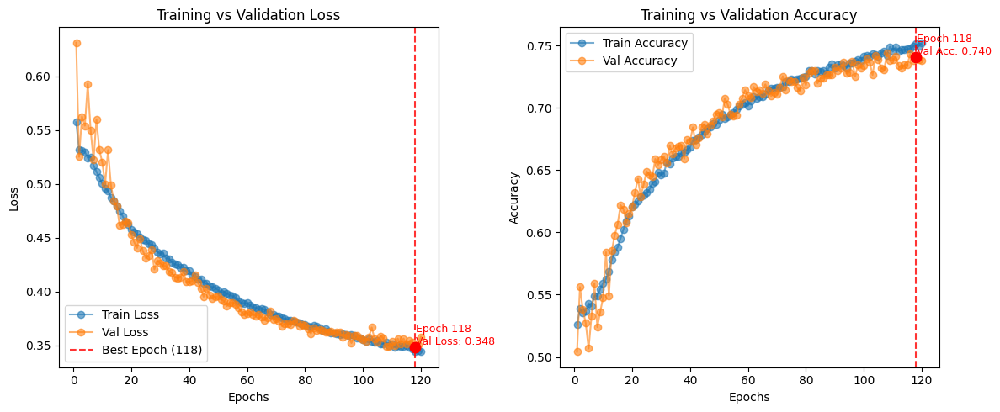

In [ ]:
plot_history_best_model(history)

In [ ]:
acc = evaluate_fewshot_distance(net, support_loader, query_loader, device=device)


[RESULT] Distance-based Few-shot Accuracy: 0.3132


In [ ]:
acc = evaluate_fewshot_cosine(net, support_loader, query_loader, device=device)


[RESULT] Cosine similarity Few-shot Accuracy: 0.3284


### 4.6  six experiment
* Model: Resnet18 + BCEWithLogits
* Image Size: 224
* Seen classes: 90
* Number of pairs per class: 50 positive + 50 negative
* Total pairs generated for training: 9000
* Number of epochs: 100
* Early stopping patience: 20

In [ ]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 90
pos_num_pairs = 50
neg_num_pairs = 50
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 54000
[INFO] Unseen dataset size: 6000
[INFO] Test dataset (unseen classes) size: 6000
[INFO] Total pairs generated for training: 9000
[INFO] Number of batches - Train: 127, Validation: 15
Support: torch.Size([10, 3, 224, 224]) torch.Size([10])
Query: torch.Size([5990, 3, 224, 224]) torch.Size([5990])


In [ ]:
net = SiameseResNet(embedding_size=128).to(device)

In [ ]:
%%time
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = torch.nn.BCEWithLogitsLoss()


epochs = 100
history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=20,
    writer=None
)

Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch [1/100] --> Train Loss: 0.6975, Train Acc: 0.5219 | Val Loss: 0.6824, Val Acc: 0.5500
  ✅ New best model saved
Epoch [2/100] --> Train Loss: 0.6814, Train Acc: 0.5572 | Val Loss: 0.6862, Val Acc: 0.4878
  ⚠️ No improvement. Early stop counter: 1/20
Epoch [3/100] --> Train Loss: 0.6703, Train Acc: 0.5812 | Val Loss: 0.6749, Val Acc: 0.5122
  ✅ New best model saved
Epoch [4/100] --> Train Loss: 0.6655, Train Acc: 0.5919 | Val Loss: 0.6593, Val Acc: 0.5633
  ✅ New best model saved
Epoch [5/100] --> Train Loss: 0.6566, Train Acc: 0.6022 | Val Loss: 0.6686, Val Acc: 0.5367
  ⚠️ No improvement. Early stop counter: 1/20
Epoch [6/100] --> Train Loss: 0.6484, Train Acc: 0.6170 | Val Loss: 0.6564, Val Acc: 0.5633
  ✅ New best model saved
Epoch [7/100] --> Train Loss: 0.6398, Train Acc: 0.6337 | Val Loss: 0.6854, Val Acc: 0.5311
  ⚠️ No improvement. Early stop counter: 1/20
Epoch [8/100] --> Train Loss: 0.6423, Train Acc: 0.6312 | Val Loss: 0.6505, Val Acc: 0.5733
  ✅ New best model saved
E

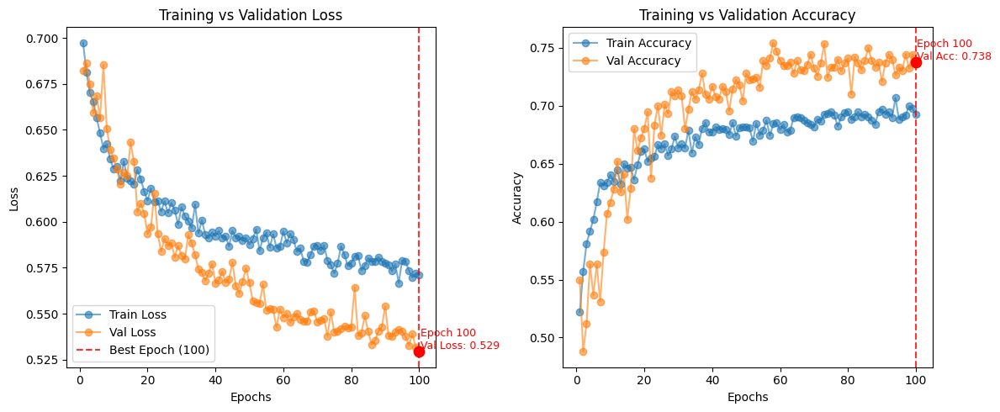

In [ ]:
plot_history(history)


In [ ]:
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.2957


## Results

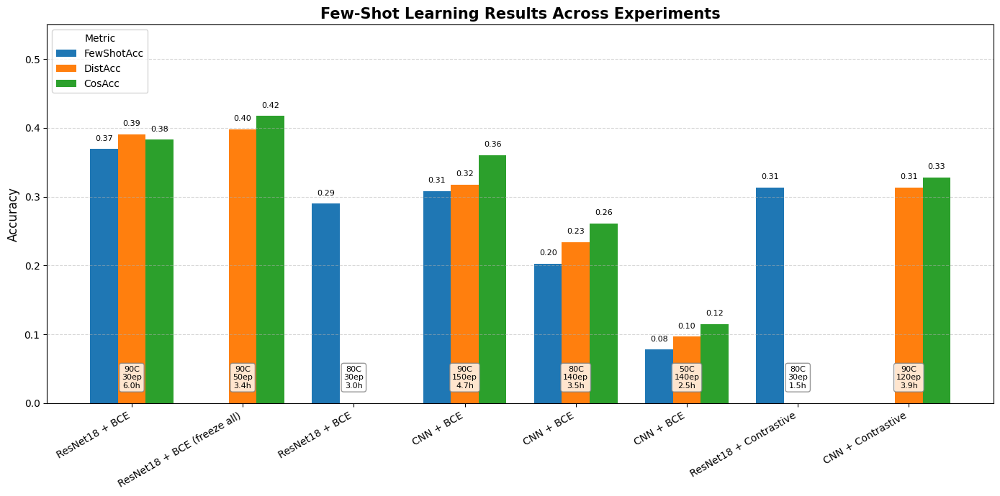

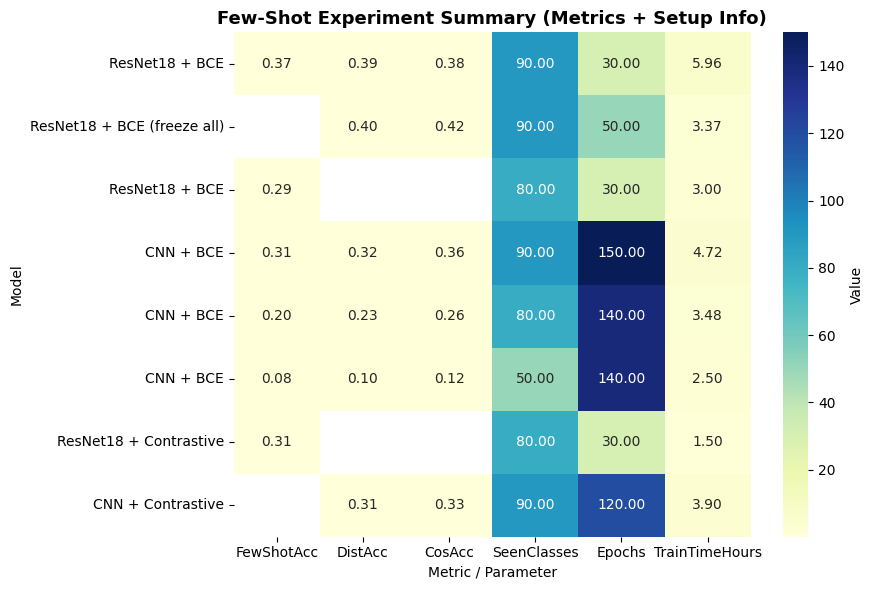

In [ ]:
# ===========================================
# 📊 Visualizing Few-Shot Learning Experiments (Detailed)
# ===========================================

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# ---- Data ----
data = [
    ["ResNet18 + BCE", 224, 90, 30, 5.96, 0.3693, 0.3907, 0.3830],
    ["ResNet18 + BCE (freeze all)", 224, 90, 50, 3.37, np.nan, 0.3978, 0.4175],
    ["ResNet18 + BCE", 224, 80, 30, 3.00, 0.2902, np.nan, np.nan],
    ["CNN + BCE", 32, 90, 150, 4.72, 0.3083, 0.3175, 0.3603],
    ["CNN + BCE", 32, 80, 140, 3.48, 0.2026, 0.2339, 0.2615],
    ["CNN + BCE", 32, 50, 140, 2.50, 0.0778, 0.0970, 0.1151],
    ["ResNet18 + Contrastive", 224, 80, 30, 1.50, 0.3132, np.nan, np.nan],
    ["CNN + Contrastive", 32, 90, 120, 3.90, np.nan, 0.3132, 0.3284],
]

cols = [
    "Model", "ImageSize", "SeenClasses", "Epochs", "TrainTimeHours",
    "FewShotAcc", "DistAcc", "CosAcc"
]
df = pd.DataFrame(data, columns=cols)
df = df.replace({None: np.nan})

# ===========================================
# 🔹 Plot 1: Grouped Bar Chart + Annotated Info
# ===========================================
metrics = ["FewShotAcc", "DistAcc", "CosAcc"]
colors = ["#1f77b4", "#ff7f0e", "#2ca02c"]

x = np.arange(len(df))
width = 0.25

plt.figure(figsize=(14,7))
for i, metric in enumerate(metrics):
    plt.bar(x + i*width - width, df[metric], width, label=metric, color=colors[i])

plt.xticks(x, df["Model"], rotation=30, ha="right", fontsize=10)
plt.ylabel("Accuracy", fontsize=12)
plt.title("Few-Shot Learning Results Across Experiments", fontsize=15, weight="bold")
plt.ylim(0, 0.55)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.legend(title="Metric", fontsize=10)

# Annotate with extra info: Seen Classes, Epochs, and Time
for i, (model, seen, epochs, time) in enumerate(zip(df["Model"], df["SeenClasses"], df["Epochs"], df["TrainTimeHours"])):
    plt.text(i, 0.02, f"{seen}C\n{epochs}ep\n{time:.1f}h",
             ha="center", va="bottom", fontsize=8,
             bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray', boxstyle='round,pad=0.3'))

# Add numeric labels for bars
for i, metric in enumerate(metrics):
    for j, val in enumerate(df[metric]):
        if not np.isnan(val):
            plt.text(j + i*width - width, val + 0.01, f"{val:.2f}",
                     ha="center", va="bottom", fontsize=8)

plt.tight_layout()
plt.show()

# ===========================================
# 🔹 Plot 2: Heatmap with Additional Info Columns
# ===========================================
# Combine metric and context info for a complete overview
heatmap_data = df[["FewShotAcc", "DistAcc", "CosAcc", "SeenClasses", "Epochs", "TrainTimeHours"]]

plt.figure(figsize=(9,6))
sns.heatmap(heatmap_data, annot=True, cmap="YlGnBu", fmt=".2f",
            yticklabels=df["Model"], cbar_kws={"label": "Value"})
plt.title("Few-Shot Experiment Summary (Metrics + Setup Info)", fontsize=13, weight="bold")
plt.ylabel("Model")
plt.xlabel("Metric / Parameter")
plt.tight_layout()
plt.show()


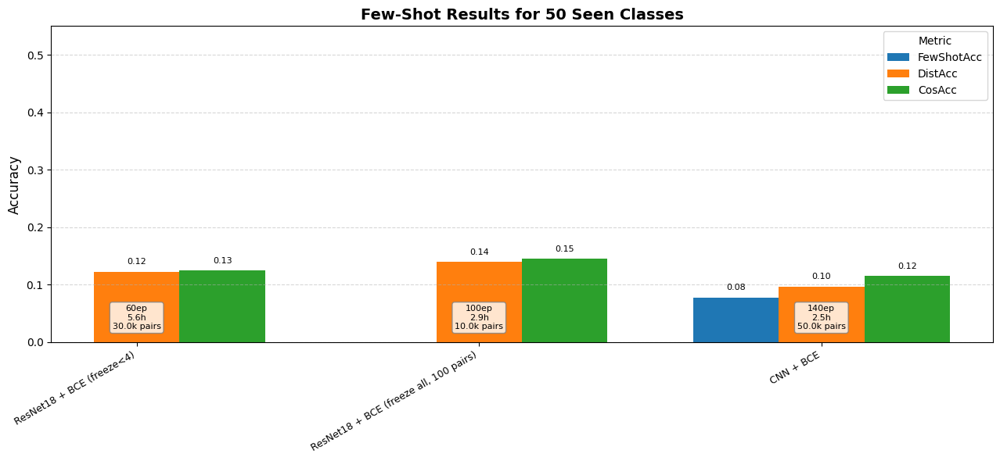

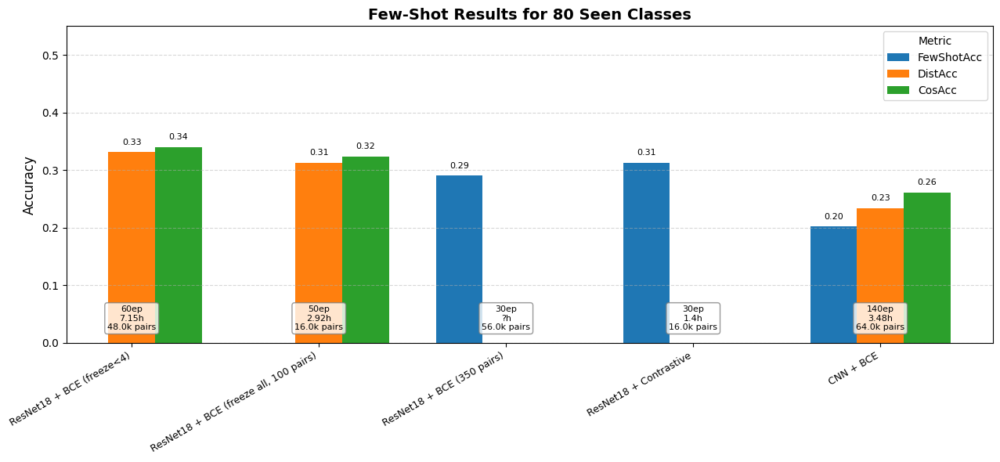

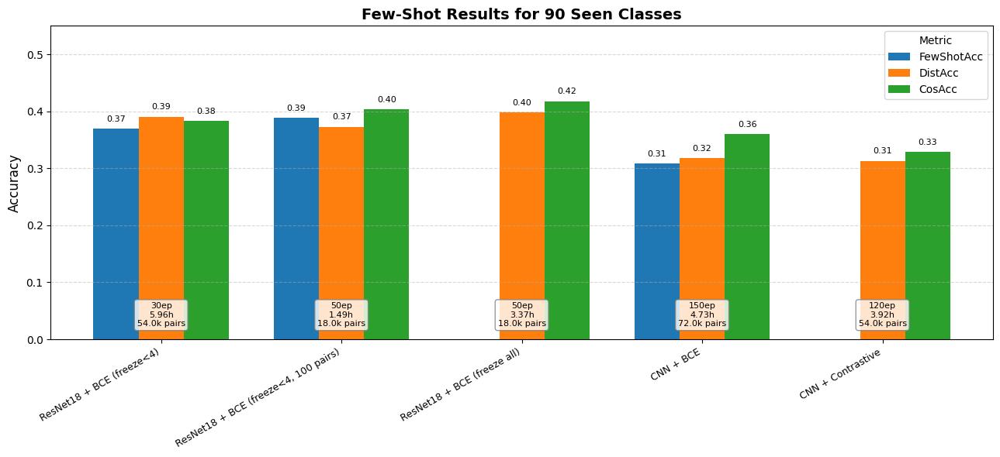

In [ ]:
# ===========================================
# 📊 Few-Shot Learning Experiments — Grouped by Seen Classes (with Training Pairs)
# ===========================================

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# ---- Full Experiment Data ----
data = [
    # ===== 90 seen classes =====
    ["ResNet18 + BCE (freeze<4)", 224, 90, 30, 5.96, 53979, 0.3693, 0.3907, 0.3830],
    ["ResNet18 + BCE (freeze<4, 100 pairs)", 224, 90, 50, 1.49, 17998, 0.3888, 0.3731, 0.4033],
    ["ResNet18 + BCE (freeze all)", 224, 90, 50, 3.37, 17998, np.nan, 0.3978, 0.4175],
    ["CNN + BCE", 32, 90, 150, 4.73, 71956, 0.3083, 0.3175, 0.3603],
    ["CNN + Contrastive", 32, 90, 120, 3.92, 53973, np.nan, 0.3132, 0.3284],

    # ===== 80 seen classes =====
    ["ResNet18 + BCE (freeze<4)", 224, 80, 60, 7.15, 47985, np.nan, 0.3313, 0.3400],
    ["ResNet18 + BCE (freeze all, 100 pairs)", 224, 80, 50, 2.92, 15998, np.nan, 0.3129, 0.3237],
    ["ResNet18 + BCE (350 pairs)", 224, 80, 30, np.nan, 55970, 0.2902, np.nan, np.nan],
    ["ResNet18 + Contrastive", 224, 80, 30, 1.40, 15999, 0.3132, np.nan, np.nan],
    ["CNN + BCE", 32, 80, 140, 3.48, 63967, 0.2026, 0.2339, 0.2615],

    # ===== 50 seen classes =====
    ["ResNet18 + BCE (freeze<4)", 224, 50, 60, 5.60, 29984, np.nan, 0.1226, 0.1251],
    ["ResNet18 + BCE (freeze all, 100 pairs)", 224, 50, 100, 2.90, 10000, np.nan, 0.1396, 0.1455],
    ["CNN + BCE", 32, 50, 140, 2.50, 49963, 0.0778, 0.0970, 0.1151],
]

cols = ["Model", "ImageSize", "SeenClasses", "Epochs", "TrainTimeHours",
        "TrainPairs", "FewShotAcc", "DistAcc", "CosAcc"]

df = pd.DataFrame(data, columns=cols)

# ===========================================
# 🔹 Plot grouped charts by number of seen classes
# ===========================================

metrics = ["FewShotAcc", "DistAcc", "CosAcc"]
colors = ["#1f77b4", "#ff7f0e", "#2ca02c"]

for seen in sorted(df["SeenClasses"].unique()):
    sub = df[df["SeenClasses"] == seen]
    x = np.arange(len(sub))
    width = 0.25

    plt.figure(figsize=(13, 6))
    for i, metric in enumerate(metrics):
        plt.bar(x + i*width - width, sub[metric], width, label=metric, color=colors[i])

    plt.xticks(x, sub["Model"], rotation=30, ha="right", fontsize=9)
    plt.ylabel("Accuracy", fontsize=12)
    plt.title(f"Few-Shot Results for {seen} Seen Classes", fontsize=14, weight="bold")
    plt.ylim(0, 0.55)
    plt.grid(axis="y", linestyle="--", alpha=0.5)
    plt.legend(title="Metric", fontsize=10)

    # Annotate each bar group with training info
    for i, (model, epochs, time, pairs) in enumerate(
        zip(sub["Model"], sub["Epochs"], sub["TrainTimeHours"], sub["TrainPairs"])
    ):
        info = f"{epochs}ep\n{time if not np.isnan(time) else '?'}h\n{pairs/1000:.1f}k pairs"
        plt.text(i, 0.02, info,
                 ha="center", va="bottom", fontsize=8,
                 bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray', boxstyle='round,pad=0.3'))

    # Add numeric labels on bars
    for i, metric in enumerate(metrics):
        for j, val in enumerate(sub[metric]):
            if not np.isnan(val):
                plt.text(j + i*width - width, val + 0.01, f"{val:.2f}",
                         ha="center", va="bottom", fontsize=8)

    plt.tight_layout()
    plt.show()
